## MSc Business Analytics & Management - Thesis: Time is Money

#### Authored by Benjamin Aston on 15/06/2025

## Run experiment

#### IMPORT PACKAGES

In [5]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from scipy import stats
from scipy.stats import qmc
from scipy.spatial.distance import pdist
from scipy.spatial import ConvexHull
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from skimpy import skim
from ydata_profiling import ProfileReport
import sweetviz as sv
from econml.dml import CausalForestDML
from dowhy import CausalModel
import networkx as nx
import seaborn as sns
from itertools import product
import torch.optim as optim
from matplotlib import gridspec

#### GENERATE CONFIGS

In [6]:
#Configuration generation process
# Define min, max
db_min, db_max = 250, 2500
mas_min, mas_max = 10, 80
par_min, par_max = 2, 10

# Compute bin width
db_bins = np.linspace(db_min, db_max, 13)
mas_bins = np.linspace(mas_min, mas_max, 13)
par_bins = np.linspace(par_min, par_max, 13)

# Get midpoints
db_mid = (db_bins[:-1] + db_bins[1:]) / 2
mas_mid = (mas_bins[:-1] + mas_bins[1:]) / 2
par_mid = (par_bins[:-1] + par_bins[1:]) / 2

# Create full grid
configurations = np.array(np.meshgrid(db_mid, mas_mid, par_mid)).T.reshape(-1, 3)

# Convert to DataFrame
configs = pd.DataFrame(configurations, columns=['database_memory_gb', 'mas_workers', 'parallel_executions'])
configs

,database_memory_gb,mas_workers,parallel_executions
0,343.75,12.916667,2.333333
1,343.75,18.750000,2.333333
2,343.75,24.583333,2.333333
3,343.75,30.416667,2.333333
4,343.75,36.250000,2.333333
...,...,...,...
1723,2406.25,53.750000,9.666667
1724,2406.25,59.583333,9.666667
1725,2406.25,65.416667,9.666667
1726,2406.25,71.250000,9.666667


#### GENERATE DATA FOR CONFIGS

In [7]:
# Generate configuration grid
db_memory = np.linspace(250, 2500, 12)
mas_workers = np.linspace(10, 80, 12)
parallel_jobs = np.linspace(2, 10, 12)

configs = pd.DataFrame(list(product(db_memory, mas_workers, parallel_jobs)),
                       columns=["DB_Memory", "MAS_Workers", "Parallel_Jobs"])

# Add constant columns
configs["model_type"] = "CPF"
configs["request_size"] = "16KB"

# Normalize variables for generating synthetic execution times
def normalize(col):
    return (col - col.min()) / (col.max() - col.min())

configs["db_norm"] = normalize(configs["DB_Memory"])
configs["mas_norm"] = normalize(configs["MAS_Workers"])
configs["par_norm"] = normalize(configs["Parallel_Jobs"])

# 1. No relationship (pure noise)
configs["execution_time_none"] = np.random.normal(loc=50, scale=5, size=len(configs))

# 2. Some relationship (additive)
configs["execution_time_some"] = (
    60
    - 10 * configs["mas_norm"]
    + 5 * configs["par_norm"]
    + 8 * configs["db_norm"]
    + np.random.normal(loc=0, scale=2, size=len(configs))
)

# 3. Full relationship (nonlinear + interaction terms)
configs["execution_time_full"] = (
    100
    - 25 * configs["mas_norm"]
    + 15 * configs["db_norm"]
    + 10 * configs["par_norm"]
    - 20 * configs["mas_norm"] * configs["db_norm"]
    + 10 * np.sin(2 * np.pi * configs["par_norm"])
    + 5 * configs["db_norm"] ** 2
    + 7 * configs["mas_norm"] * configs["par_norm"]
    + np.random.normal(loc=0, scale=1.5, size=len(configs))
)

# Create config ID
configs["Configuration"] = ["Config_" + str(i + 1) for i in range(len(configs))]

final_cols = ["Configuration", "DB_Memory", "MAS_Workers", "Parallel_Jobs", "model_type", "request_size",
              "execution_time_none", "execution_time_some", "execution_time_full"]

#Uncomment for no interaction data
execution_results = configs.drop(columns=["execution_time_some", "execution_time_full"]).copy()
execution_results.rename(columns={"execution_time_none": "Execution_Time"}, inplace=True)

#Uncomment for some interaction data
# execution_results = configs.drop(columns=["execution_time_none", "execution_time_full"]).copy()
# execution_results.rename(columns={"execution_time_some": "Execution_Time"}, inplace=True)

#Uncomment for full interaction data
# execution_results = configs.drop(columns=["execution_time_none", "execution_time_some"]).copy()
# execution_results.rename(columns={"execution_time_full": "Execution_Time"}, inplace=True)

# Remove control config (e.g. "Config_328") from sampling pool
control_config_id = "Config_328"

# Exclude from sampling pool
configs_no_control = configs[configs["Configuration"] != control_config_id].copy()
execution_results = execution_results[execution_results["Configuration"] != control_config_id].copy()

execution_results

,DB_Memory,MAS_Workers,Parallel_Jobs,model_type,request_size,db_norm,mas_norm,par_norm,Execution_Time,Configuration
0,250.0,10.0,2.000000,CPF,16KB,0.0,0.0,0.000000,56.199492,Config_1
1,250.0,10.0,2.727273,CPF,16KB,0.0,0.0,0.090909,46.301718,Config_2
2,250.0,10.0,3.454545,CPF,16KB,0.0,0.0,0.181818,50.685093,Config_3
3,250.0,10.0,4.181818,CPF,16KB,0.0,0.0,0.272727,54.532711,Config_4
4,250.0,10.0,4.909091,CPF,16KB,0.0,0.0,0.363636,50.259676,Config_5
...,...,...,...,...,...,...,...,...,...,...
1723,2500.0,80.0,7.090909,CPF,16KB,1.0,1.0,0.636364,48.801135,Config_1724
1724,2500.0,80.0,7.818182,CPF,16KB,1.0,1.0,0.727273,65.148701,Config_1725
1725,2500.0,80.0,8.545455,CPF,16KB,1.0,1.0,0.818182,56.658541,Config_1726
1726,2500.0,80.0,9.272727,CPF,16KB,1.0,1.0,0.909091,52.607854,Config_1727


### Phase 1: Sampling

#### EXECUTE LHS AND BO PROCESS

{'Mean Pairwise Distance': 887.3916573062297, 'Coverage Score': {'DB_Memory': 1.0, 'MAS_Workers': 1.0, 'Parallel_Jobs': 1.0}, 'Discrepancy Metric': 301412.60852677375}
      DB_Memory  MAS_Workers  Parallel_Jobs model_type request_size   db_norm  \
0   1068.181818    54.545455       4.909091        CPF         16KB  0.363636   
1    863.636364    29.090909      10.000000        CPF         16KB  0.272727   
2    250.000000    67.272727       3.454545        CPF         16KB  0.000000   
3   2500.000000    22.727273       2.000000        CPF         16KB  1.000000   
4   2295.454545    60.909091       7.818182        CPF         16KB  0.909091   
5    659.090909    16.363636       6.363636        CPF         16KB  0.181818   
6   1681.818182    10.000000       5.636364        CPF         16KB  0.636364   
7    454.545455    48.181818       9.272727        CPF         16KB  0.090909   
8   1272.727273    80.000000       8.545455        CPF         16KB  0.454545   
9   2090.909091    73.

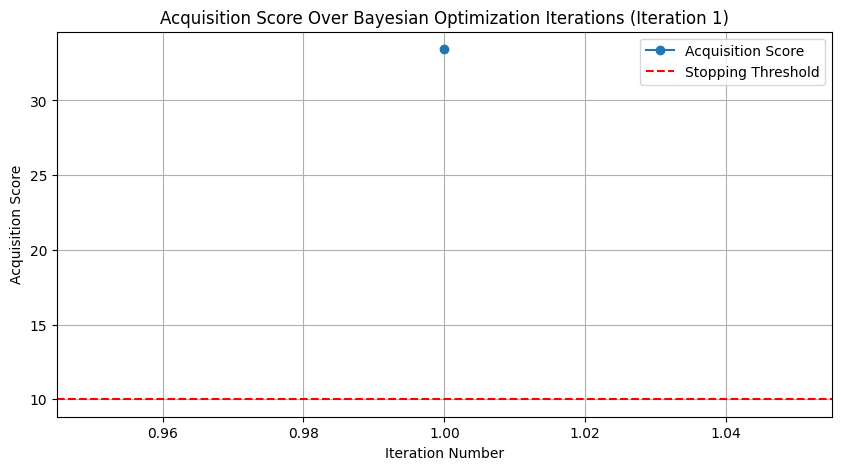


🔄 Starting Bayesian Optimization Iteration 2...


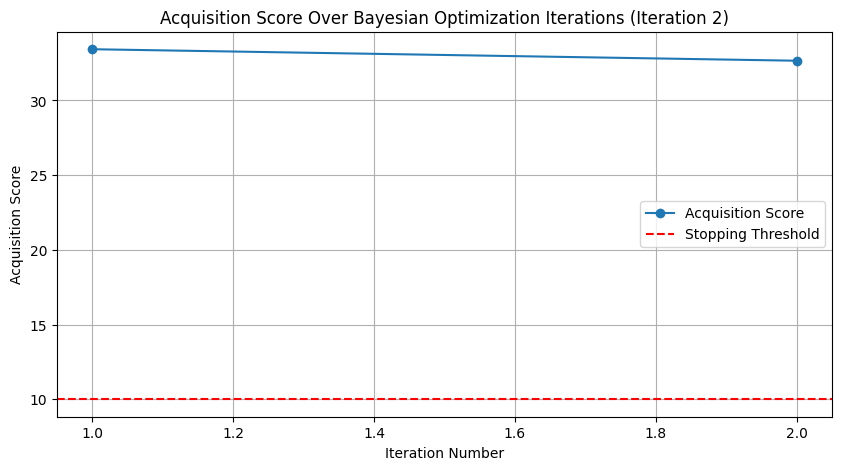


🔄 Starting Bayesian Optimization Iteration 3...


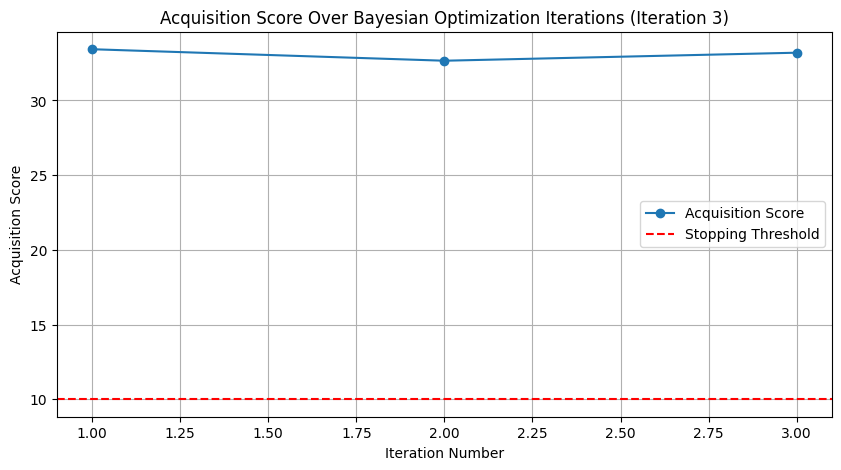


🔄 Starting Bayesian Optimization Iteration 4...


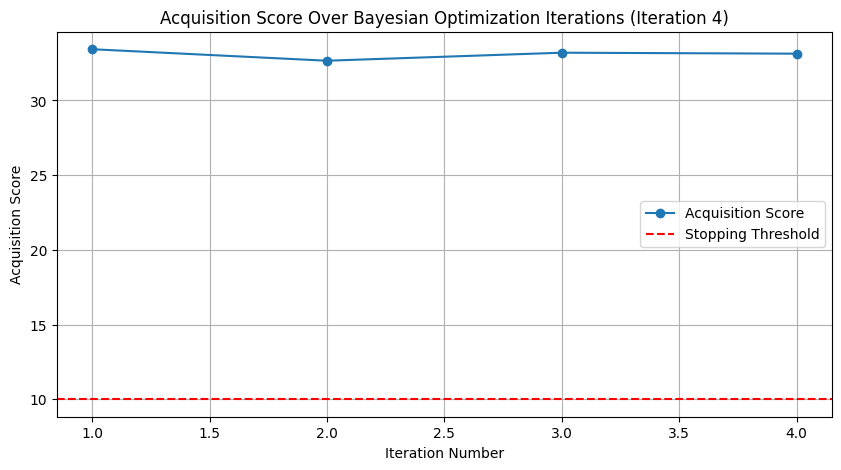


🔄 Starting Bayesian Optimization Iteration 5...


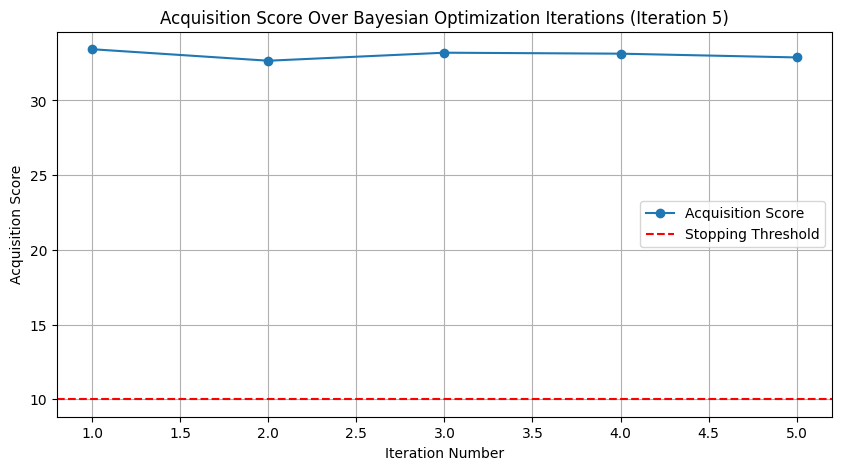


🔄 Starting Bayesian Optimization Iteration 6...


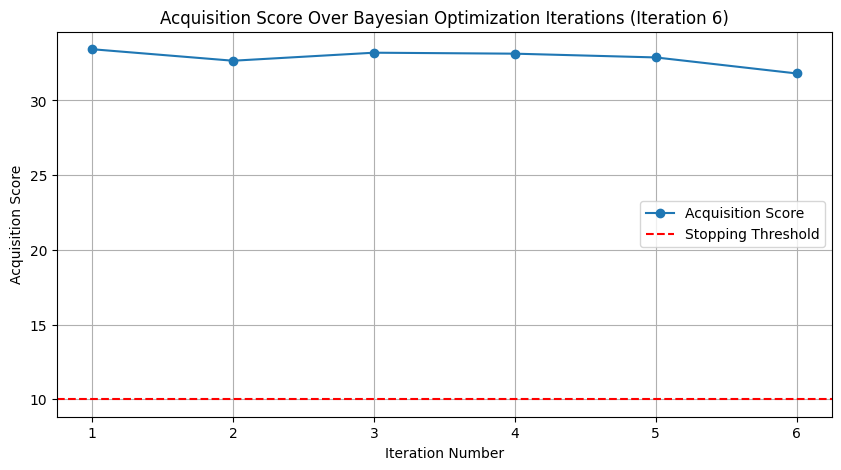


🔄 Starting Bayesian Optimization Iteration 7...


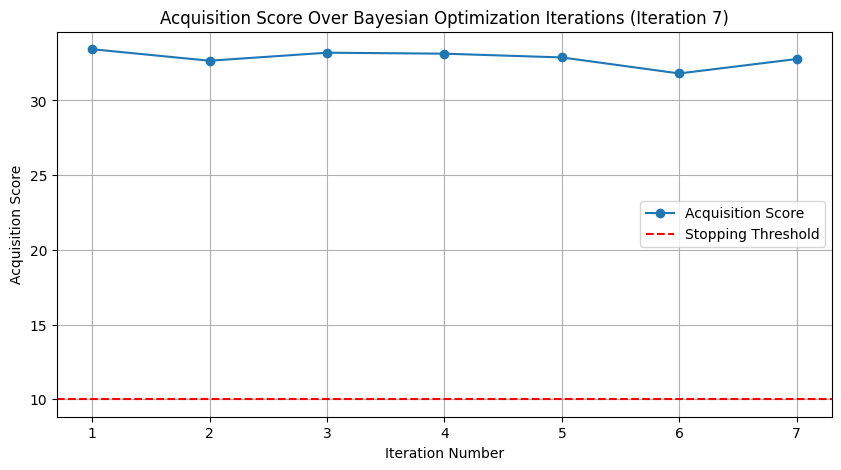


🔄 Starting Bayesian Optimization Iteration 8...


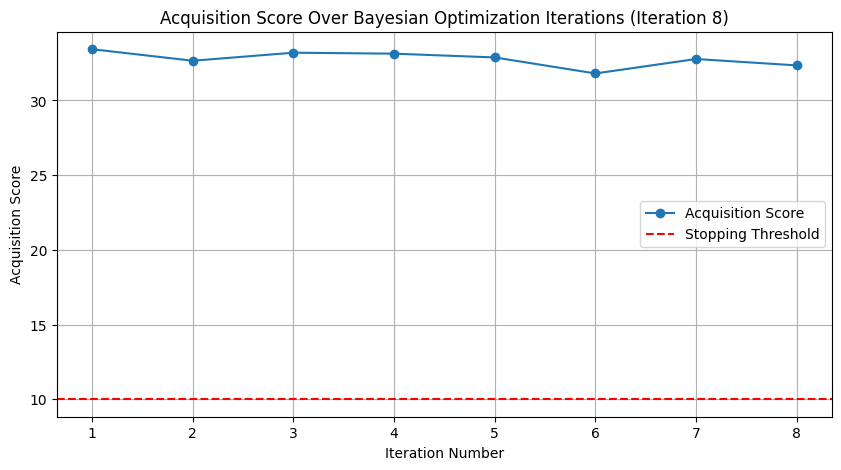


🔄 Starting Bayesian Optimization Iteration 9...


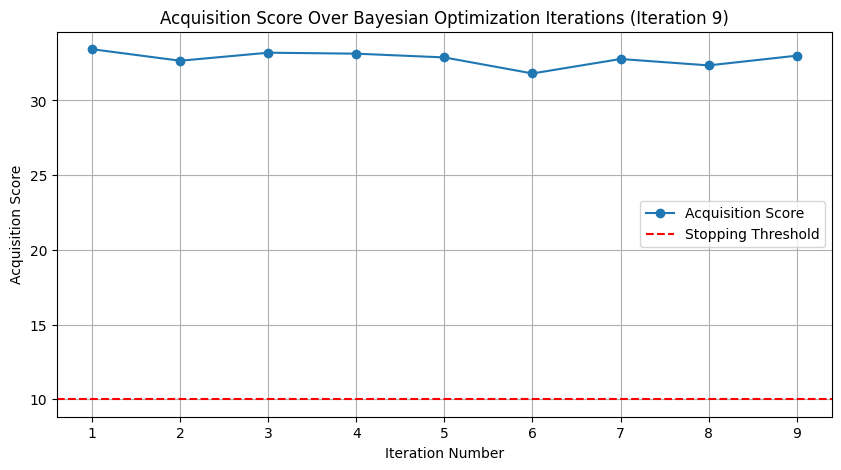


🔄 Starting Bayesian Optimization Iteration 10...


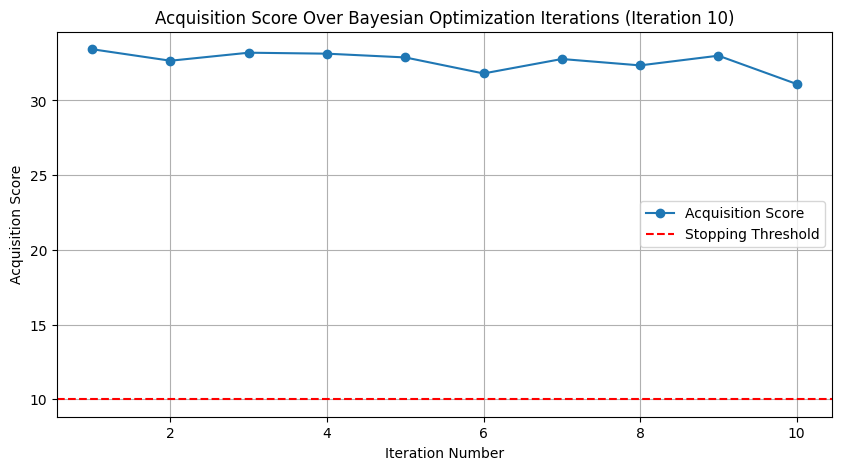


🔄 Starting Bayesian Optimization Iteration 11...


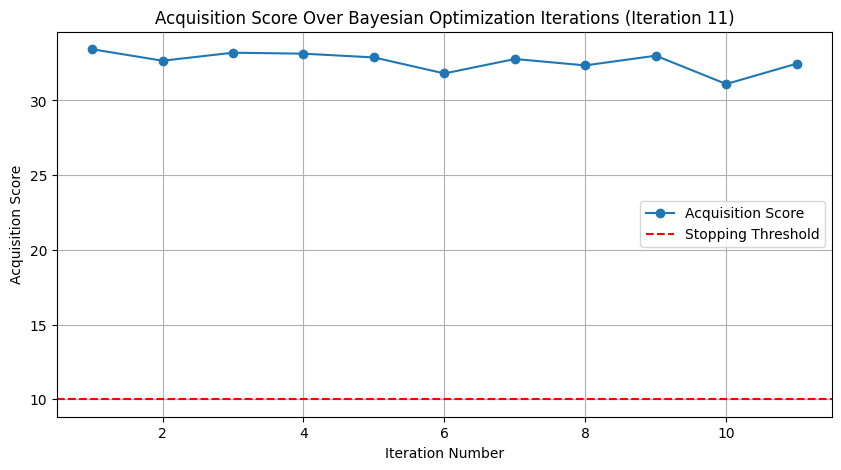


🔄 Starting Bayesian Optimization Iteration 12...


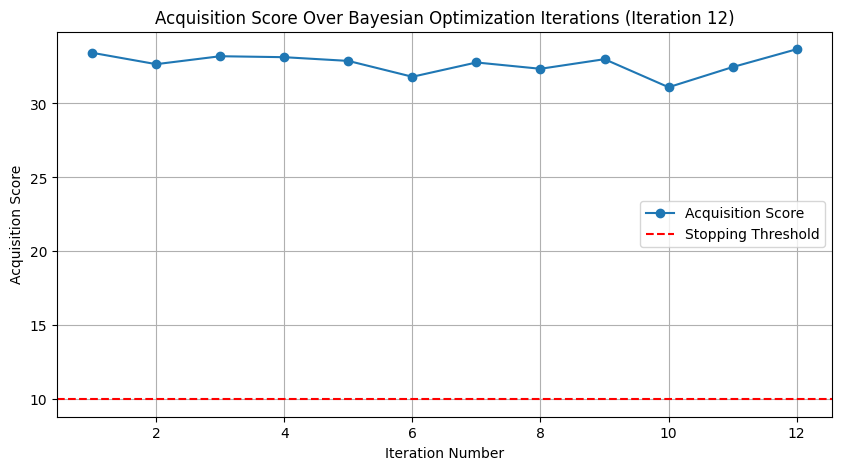


🔄 Starting Bayesian Optimization Iteration 13...


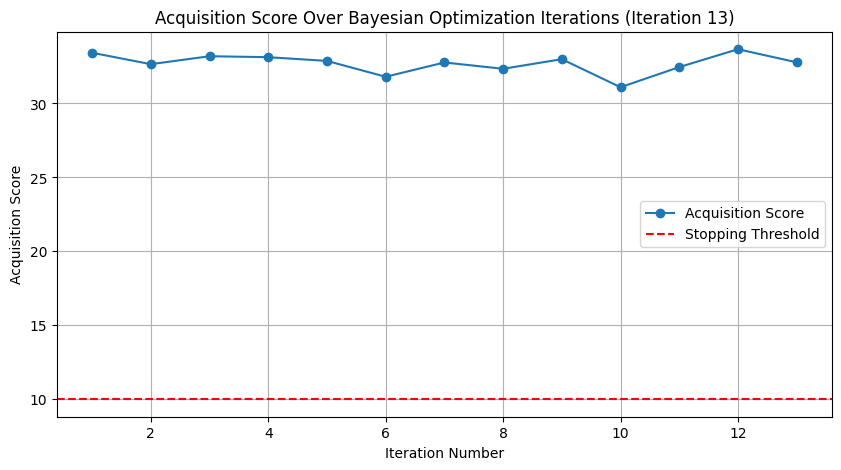


🔄 Starting Bayesian Optimization Iteration 14...


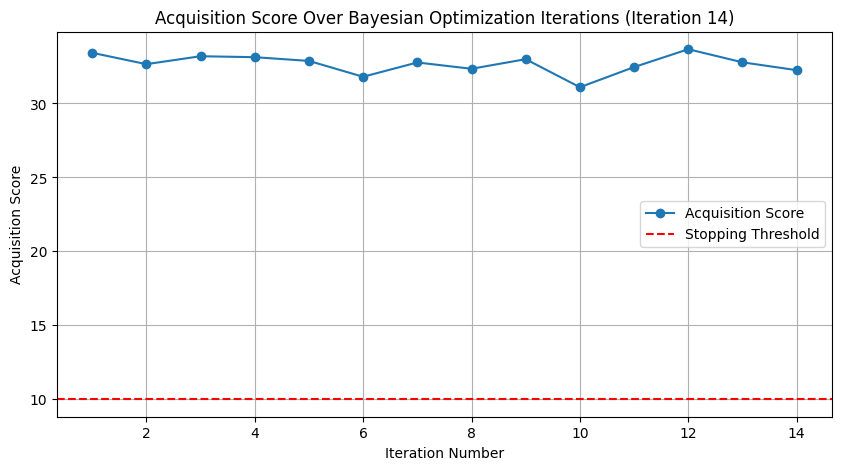


🔄 Starting Bayesian Optimization Iteration 15...


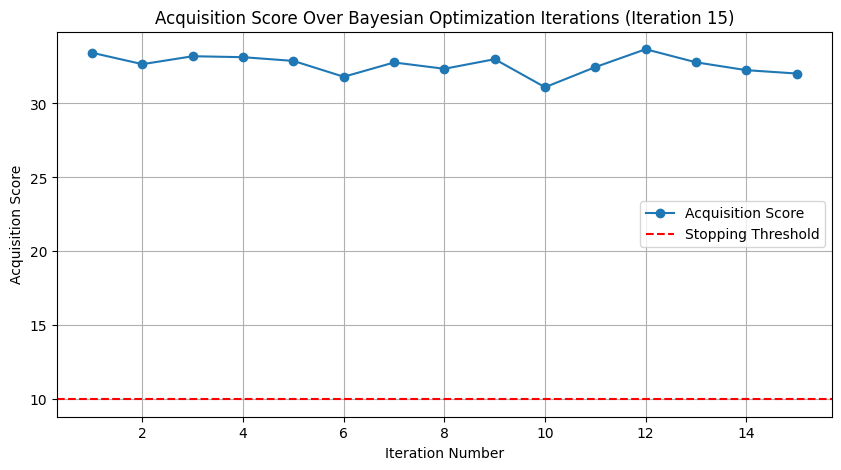


🔄 Starting Bayesian Optimization Iteration 16...


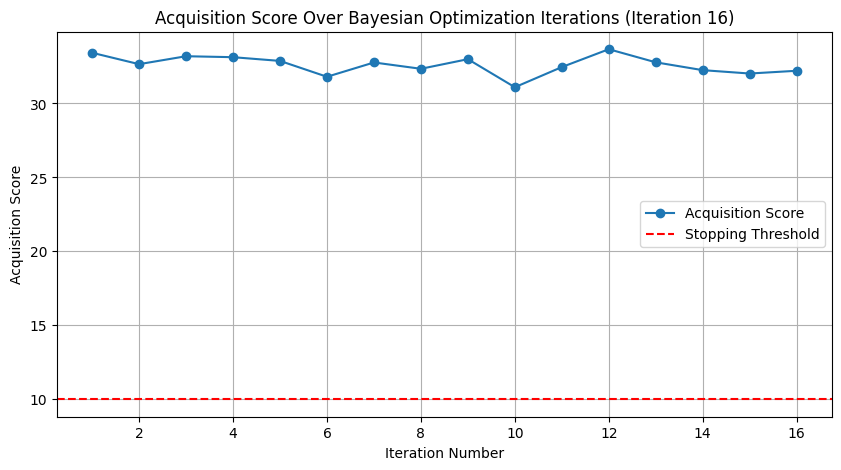


🔄 Starting Bayesian Optimization Iteration 17...


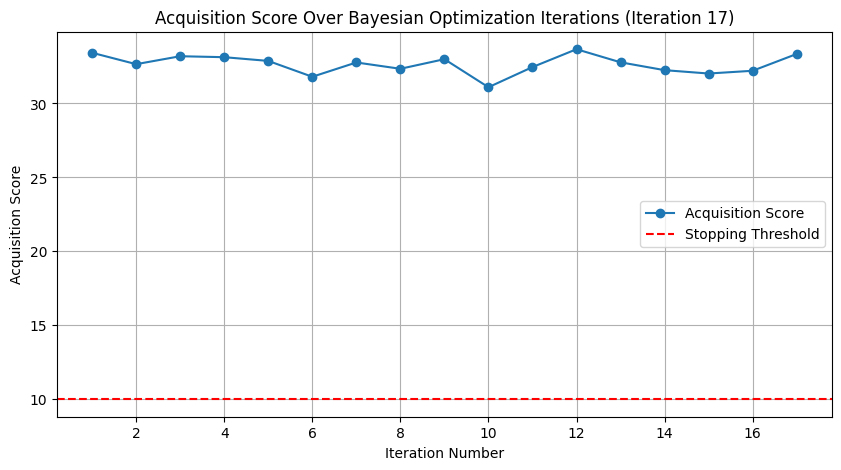


🔄 Starting Bayesian Optimization Iteration 18...


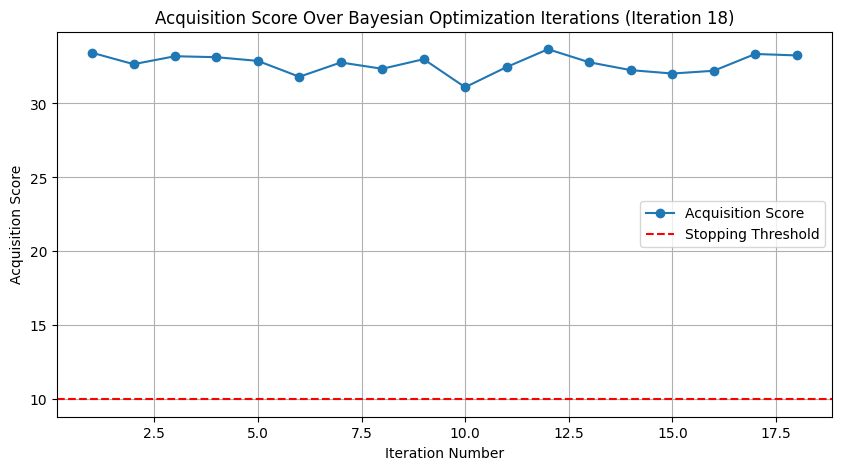


🔄 Starting Bayesian Optimization Iteration 19...


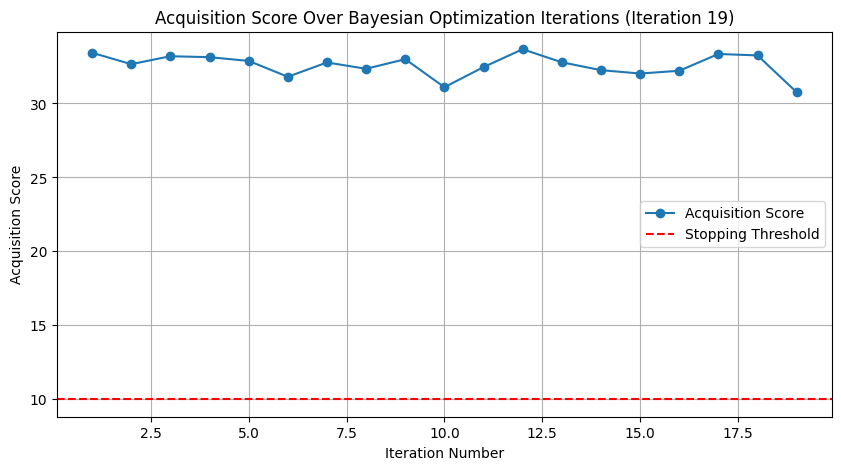


🔄 Starting Bayesian Optimization Iteration 20...


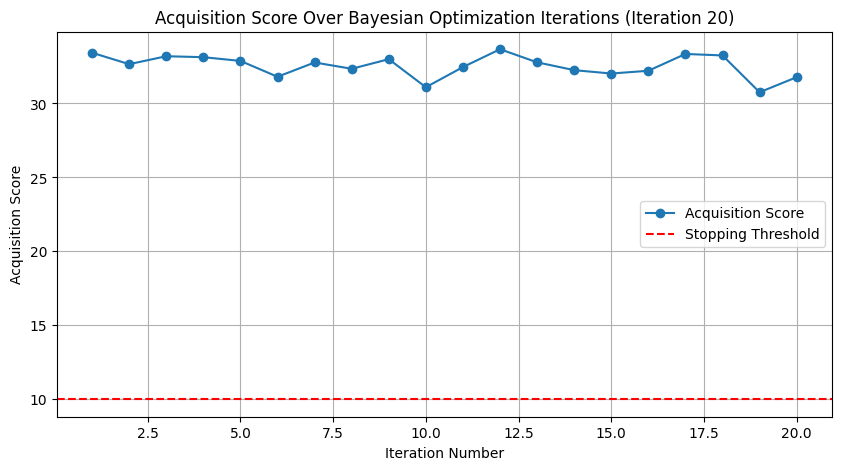


🔄 Starting Bayesian Optimization Iteration 21...


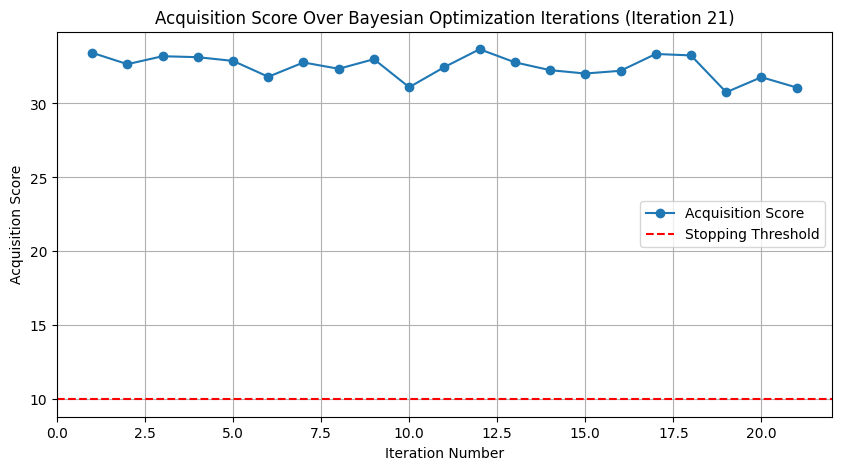


🔄 Starting Bayesian Optimization Iteration 22...


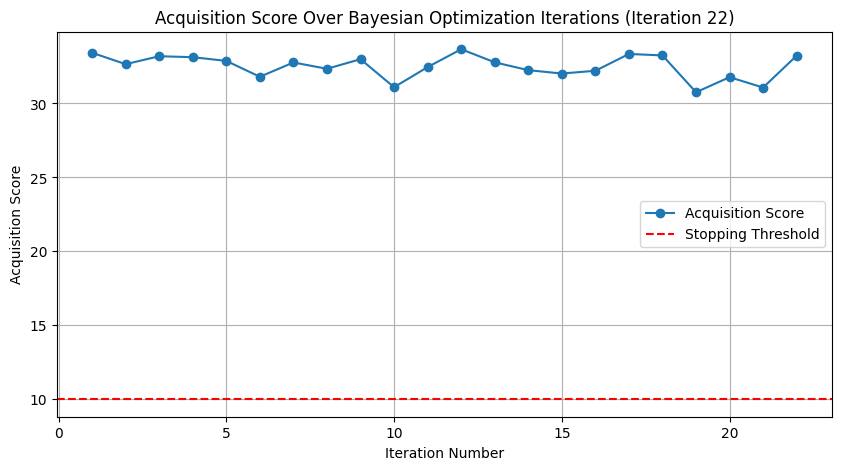


🔄 Starting Bayesian Optimization Iteration 23...


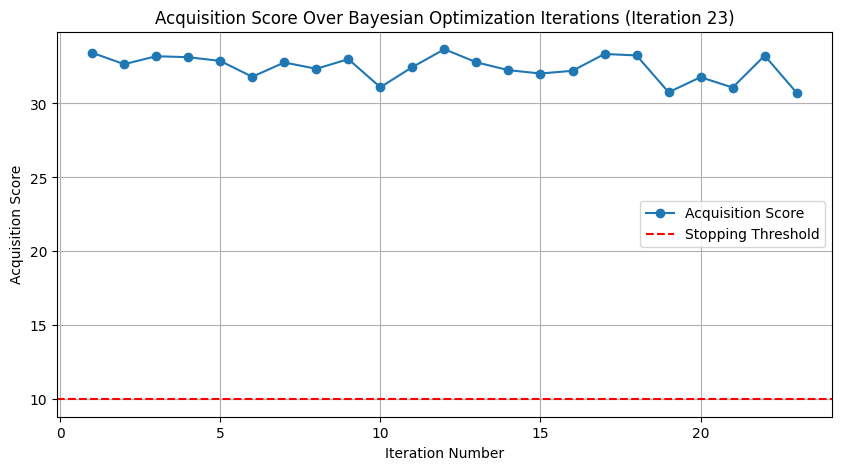


🔄 Starting Bayesian Optimization Iteration 24...


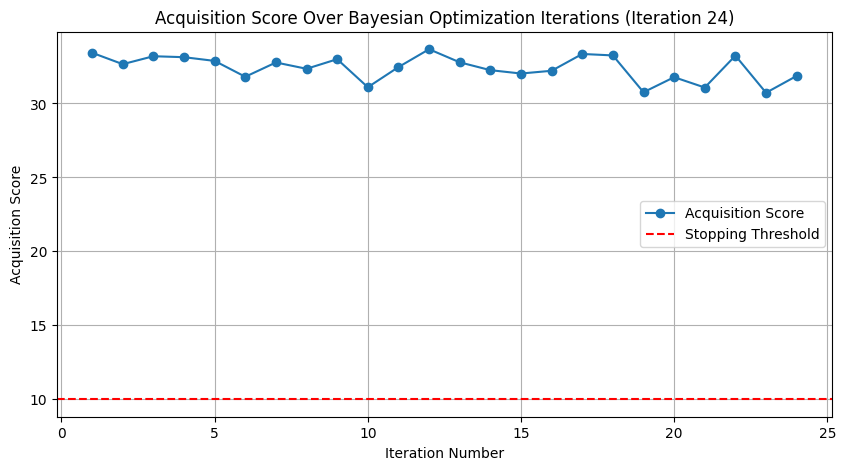


🔄 Starting Bayesian Optimization Iteration 25...


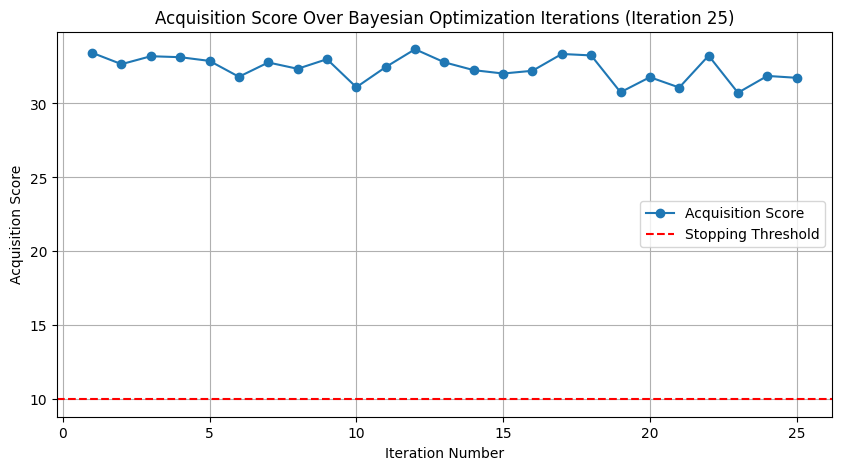


🔄 Starting Bayesian Optimization Iteration 26...


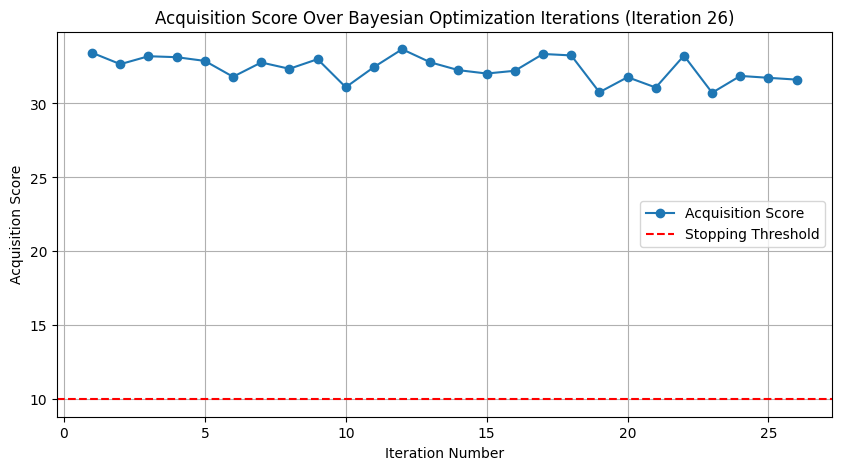


🔄 Starting Bayesian Optimization Iteration 27...


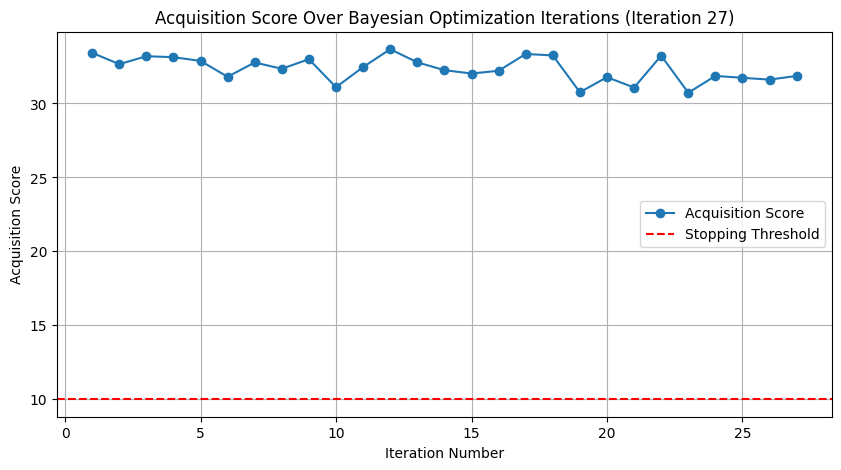


🔄 Starting Bayesian Optimization Iteration 28...


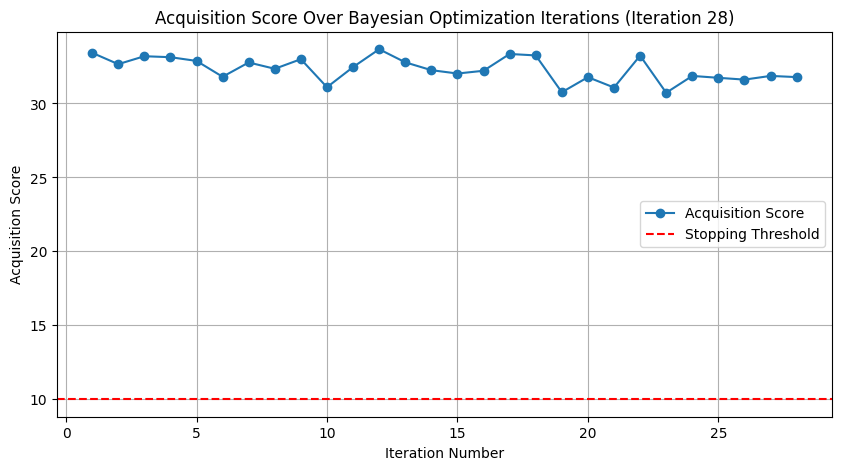


🔄 Starting Bayesian Optimization Iteration 29...


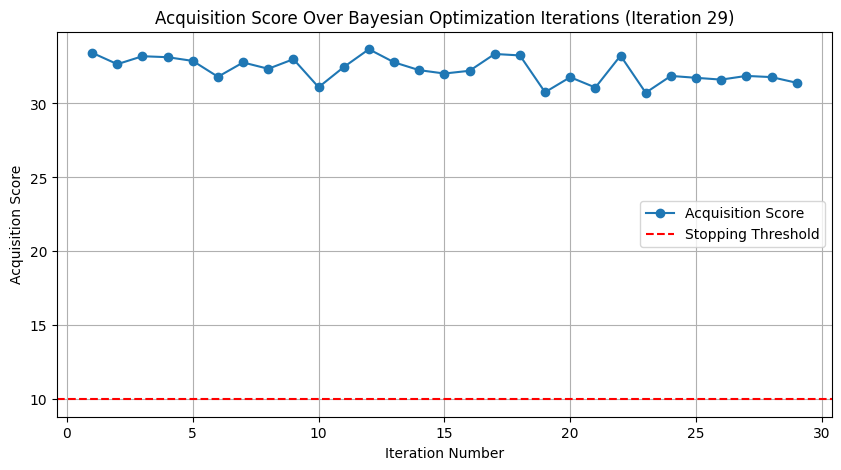


🔄 Starting Bayesian Optimization Iteration 30...


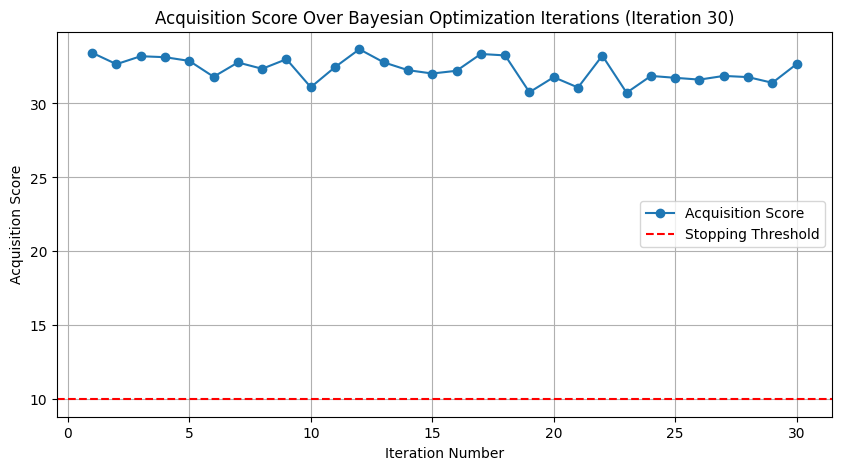


🔄 Starting Bayesian Optimization Iteration 31...


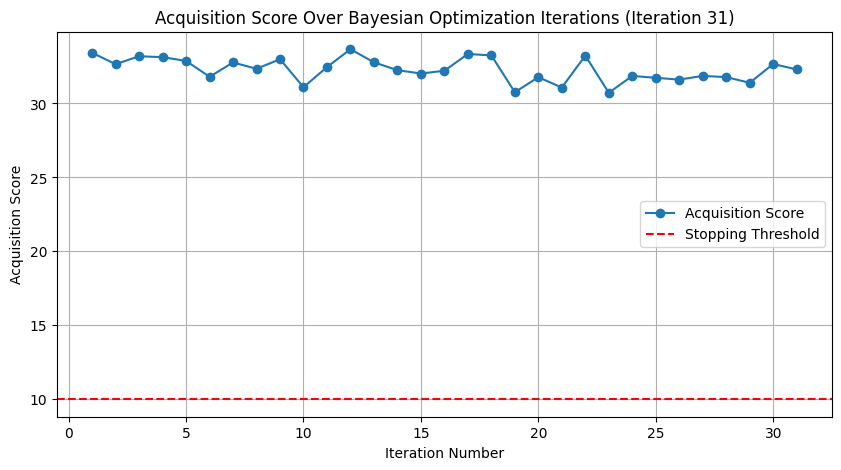


🔄 Starting Bayesian Optimization Iteration 32...


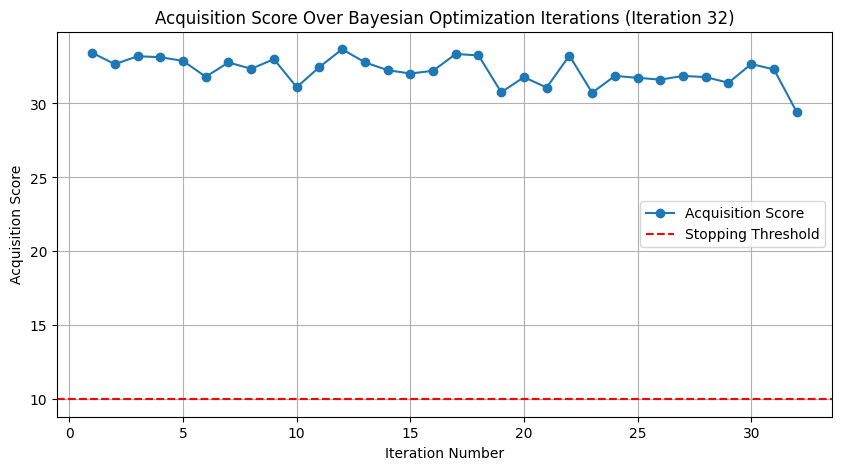


🔄 Starting Bayesian Optimization Iteration 33...


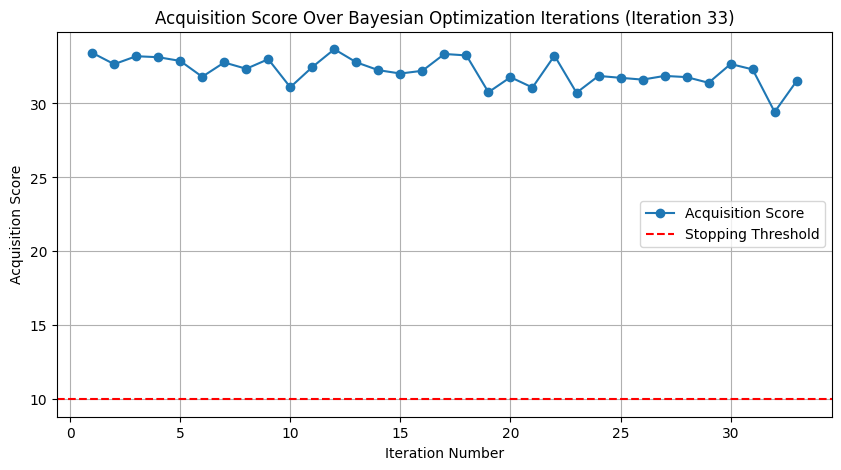


🔄 Starting Bayesian Optimization Iteration 34...


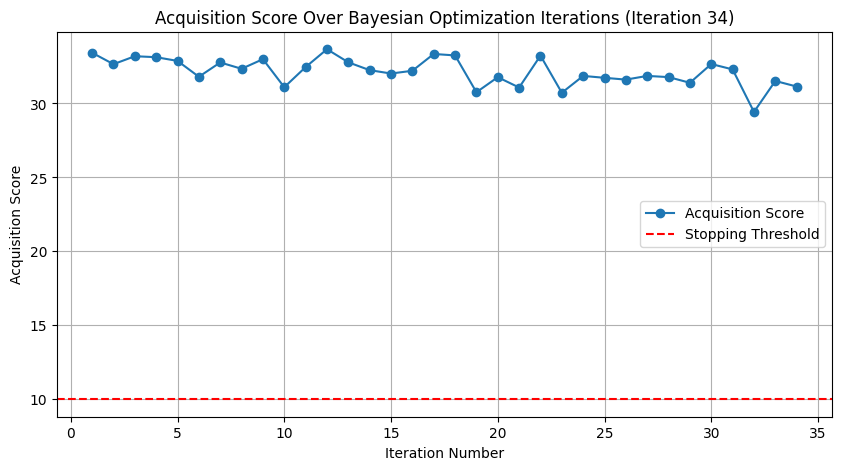


🔄 Starting Bayesian Optimization Iteration 35...


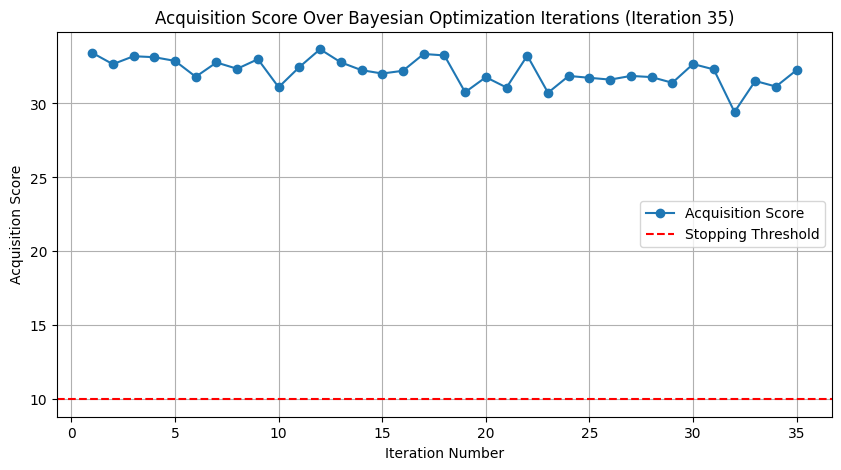


🔄 Starting Bayesian Optimization Iteration 36...


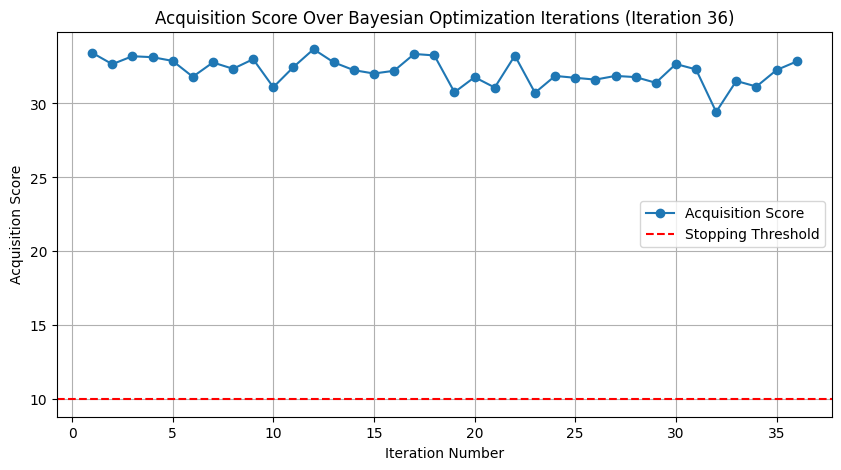


🔄 Starting Bayesian Optimization Iteration 37...


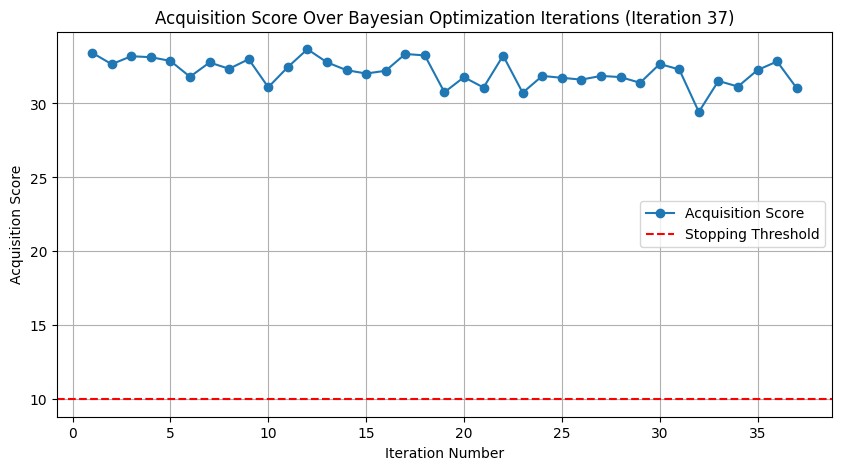


🔄 Starting Bayesian Optimization Iteration 38...


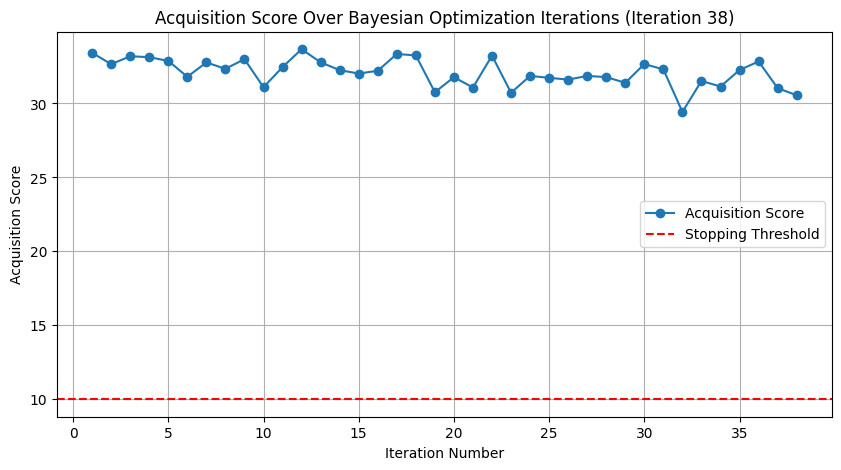


🔄 Starting Bayesian Optimization Iteration 39...


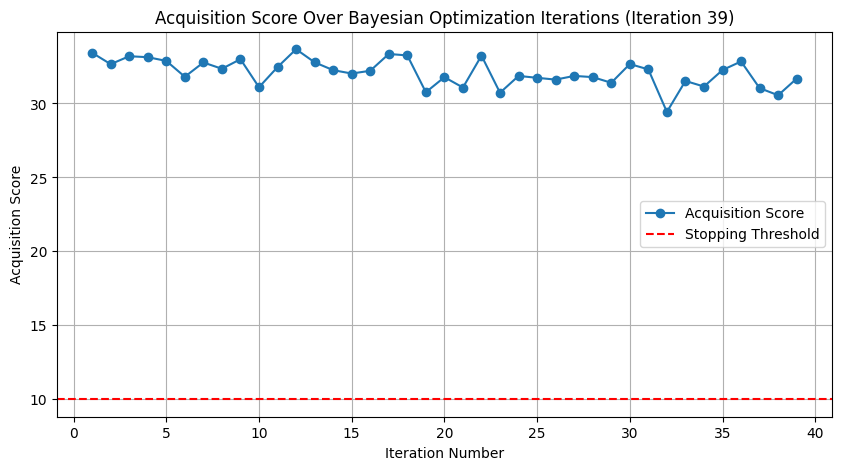


🔄 Starting Bayesian Optimization Iteration 40...


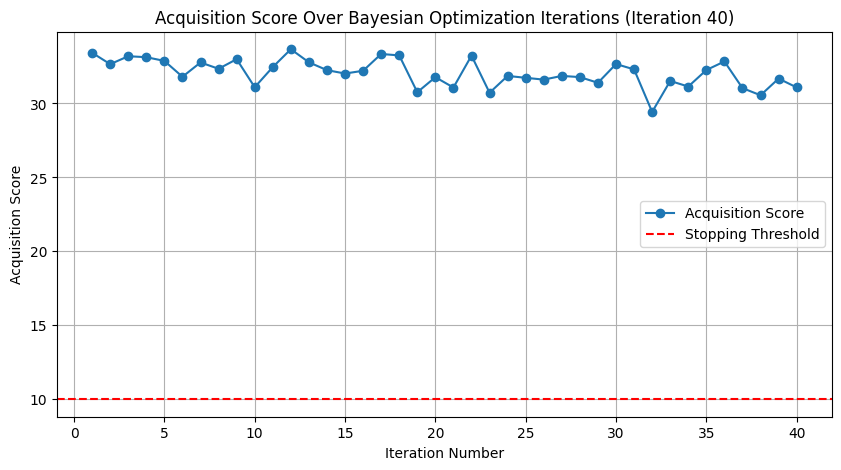


⏹️ Maximum iterations (40) reached. Stopping BO.
      DB_Memory  MAS_Workers  Parallel_Jobs model_type request_size   db_norm  \
0   1068.181818    54.545455       4.909091        CPF         16KB  0.363636   
1    863.636364    29.090909      10.000000        CPF         16KB  0.272727   
2    250.000000    67.272727       3.454545        CPF         16KB  0.000000   
3   2500.000000    22.727273       2.000000        CPF         16KB  1.000000   
4   2295.454545    60.909091       7.818182        CPF         16KB  0.909091   
5    659.090909    16.363636       6.363636        CPF         16KB  0.181818   
6   1681.818182    10.000000       5.636364        CPF         16KB  0.636364   
7    454.545455    48.181818       9.272727        CPF         16KB  0.090909   
8   1272.727273    80.000000       8.545455        CPF         16KB  0.454545   
9   2090.909091    73.636364       2.727273        CPF         16KB  0.818182   
10  1886.363636    35.454545       4.181818        CPF     

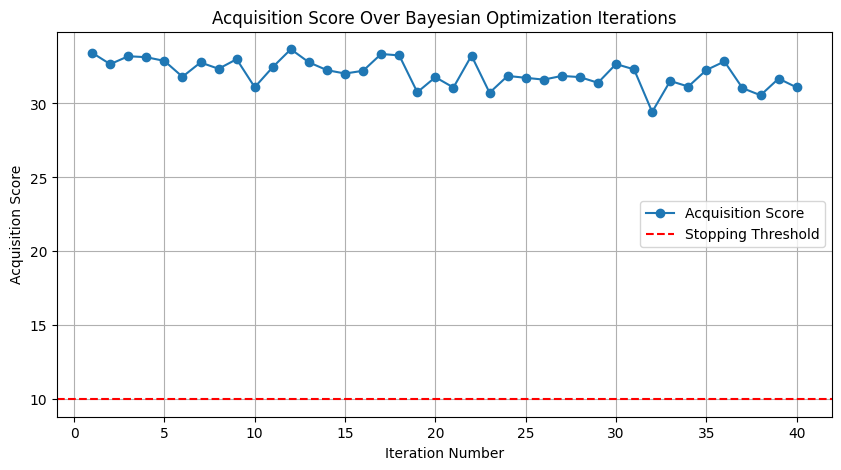

In [8]:
#Define function
def estimate_uncertainty(model, X):
    """
    Estimates uncertainty by calculating the standard deviation of predictions from each tree in the forest.
    """
    all_preds = np.stack([tree.predict(X) for tree in model.estimators_], axis=0)
    return np.mean(all_preds, axis=0), np.std(all_preds, axis=0)

tolerance_threshold = 10  # Example threshold for stopping
N_average_tol = 3        # Number of iterations to average for stopping criteria
max_iterations = 40  # Set to None if you want unlimited iterations

# Configuration
num_initial_tests = 12  # Number of initial test cases

# Define a flag for simulation mode
simulated = True  # Set to False for manual mode

# Define search space
db_memory_values = sorted(configs_no_control["DB_Memory"].unique())
mas_workers_values = sorted(configs_no_control["MAS_Workers"].unique())
parallel_jobs_values = sorted(configs_no_control["Parallel_Jobs"].unique())

# Perform Latin Hypercube Sampling (LHS)
sampler = qmc.LatinHypercube(d=3, seed=42)
lhs_samples = sampler.random(num_initial_tests)

# Map LHS samples to discrete configuration values
df_lhs_initial = pd.DataFrame({
    "DB_Memory": [db_memory_values[int(i * len(db_memory_values))] for i in lhs_samples[:, 0]],
    "MAS_Workers": [mas_workers_values[int(i * len(mas_workers_values))] for i in lhs_samples[:, 1]],
    "Parallel_Jobs": [parallel_jobs_values[int(i * len(parallel_jobs_values))] for i in lhs_samples[:, 2]]
})

# Merge with actual configurations
df_lhs_initial = df_lhs_initial.merge(configs_no_control, on=["DB_Memory", "MAS_Workers", "Parallel_Jobs"], how="inner")
df_lhs_initial["Selection_Method"] = "LHS"

# Compute LHS selection metrics
lhs_points = df_lhs_initial[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
pairwise_distances = pdist(lhs_points, metric='euclidean')

lhs_metrics = {
    "Mean Pairwise Distance": np.mean(pairwise_distances),
    "Coverage Score": {
        "DB_Memory": len(df_lhs_initial["DB_Memory"].unique()) / len(db_memory_values),
        "MAS_Workers": len(df_lhs_initial["MAS_Workers"].unique()) / len(mas_workers_values),
        "Parallel_Jobs": len(df_lhs_initial["Parallel_Jobs"].unique()) / len(parallel_jobs_values)
    },
    "Discrepancy Metric": np.var(pairwise_distances)
}

print(lhs_metrics)

#Manaully input execution time for LHS test cases
# Assign execution times based on simulation mode
if simulated:
    df_lhs_initial["Execution_Time"] = np.random.uniform(10, 100, size=len(df_lhs_initial))  # Generate random execution times
else:
    for index, row in df_lhs_initial.iterrows():
        while True:
            try:
                user_input = float(input(f"Enter execution time for {row['Configuration']}: "))
                df_lhs_initial.at[index, "Execution_Time"] = user_input
                break
            except ValueError:
                print("Invalid input. Please enter a numeric execution time.")

# Display LHS results and metrics
print(df_lhs_initial)
lhs_metrics

# Reset variables
used_configs = set(df_lhs_initial["Configuration"].unique())
df_live_bo = df_lhs_initial.copy()
print(df_lhs_initial)
df_live_bo["Acquisition_Score"] = np.nan
df_available_configs = configs[~configs["Configuration"].isin(used_configs)].copy()

# BO Tracking Variables
iteration_numbers = []
acquisition_scores = []
uncertainty_snapshots = []
acquisition_history = []
iteration = 1
bo_selected_cases = []
print(df_live_bo)
while True:
    print(f"\n🔄 Starting Bayesian Optimization Iteration {iteration}...")

    # Update available configurations
    df_available_configs = configs[~configs["Configuration"].isin(used_configs)].copy()
    
    if df_available_configs.empty:
        print("✅ No more unique configurations left. Stopping BO.")
        break  

    # Train Model
    X_train = df_live_bo[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
    y_train = df_live_bo["Execution_Time"].values
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train_scaled, y_train)

    # Estimate Uncertainty
    X_available_scaled = scaler.transform(df_available_configs[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values)
    mean_prediction, std_prediction = estimate_uncertainty(rf, X_available_scaled)
    uncertainty_snapshots.append((mean_prediction.copy(), std_prediction.copy(), iteration))
    
    # Compute Acquisition Score
    acquisition_score = std_prediction * np.random.rand(len(std_prediction))

    # Select New Test Case
    next_index = np.argmax(acquisition_score)
    next_test_case = df_available_configs.iloc[next_index].copy()
    used_configs.add(next_test_case["Configuration"])
    df_available_configs = df_available_configs.drop(df_available_configs.index[next_index])

    # Determine Execution Time: Simulated or Manual
    if simulated:
        # Use synthetic execution time
        next_test_case["Execution_Time"] = execution_results.loc[
            execution_results["Configuration"] == next_test_case["Configuration"], "Execution_Time"
        ].values[0]
    else:
        # Request manual input for execution time
        while True:
            try:
                user_input = float(input(f"Enter execution time for {next_test_case['Configuration']}: "))
                next_test_case["Execution_Time"] = user_input
                break
            except ValueError:
                print("Invalid input. Please enter a numeric execution time.")

    # Assign BO Metadata
    next_test_case["Selection_Method"] = "BO"
    next_test_case["Acquisition_Score"] = acquisition_score[next_index]

    # Store results
    bo_selected_cases.append(next_test_case)
    iteration_numbers.append(iteration)
    acquisition_scores.append(acquisition_score[next_index])
    acquisition_history.append(acquisition_score[next_index])

    # Display progress plot after each iteration
    plt.figure(figsize=(10, 5))
    plt.plot(iteration_numbers, acquisition_scores, marker='o', linestyle='-', label="Acquisition Score")
    plt.axhline(y=tolerance_threshold, color='r', linestyle='--', label="Stopping Threshold")
    plt.xlabel("Iteration Number")
    plt.ylabel("Acquisition Score")
    plt.title(f"Acquisition Score Over Bayesian Optimization Iterations (Iteration {iteration})")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Check stopping criteria: tolerance-based
    if len(acquisition_history) >= N_average_tol and np.mean(acquisition_history[-N_average_tol:]) < tolerance_threshold:
        print(f"\Stopping criteria met at iteration {iteration}. Ending BO process.")
        break
    
    # Check stopping criteria: maximum iteration cap
    if max_iterations is not None and iteration >= max_iterations:
        print(f"\Maximum iterations ({max_iterations}) reached. Stopping BO.")
        break

    iteration += 1

# Convert BO Cases into DataFrame
df_bo_cases = pd.DataFrame(bo_selected_cases)

# Merge LHS and BO results
df_live_bo = pd.concat([df_live_bo, df_bo_cases], ignore_index=True)

# Display results
print(df_live_bo)
df_live_bo.to_csv(r"C:\Users\benja\Documents\MSC BAM\THESIS\Data\simulated_final_results.csv") #Change by user

# Plot Acquisition Scores
plt.figure(figsize=(10, 5))
plt.plot(iteration_numbers, acquisition_scores, marker='o', linestyle='-', label="Acquisition Score")
plt.axhline(y=tolerance_threshold, color='r', linestyle='--', label="Stopping Threshold")
plt.xlabel("Iteration Number")
plt.ylabel("Acquisition Score")
plt.title("Acquisition Score Over Bayesian Optimization Iterations")
plt.legend()
plt.grid(True)
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\Feature_space_sampling.png") #Change by user
plt.show()


#### GENERATE PLOT ACROSS BO PROCESS TO SHOW LEARNING

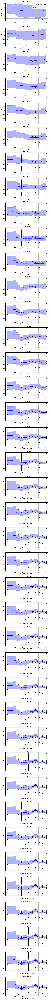

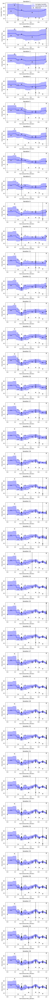

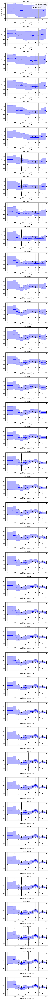

In [9]:
def plot_bo_learning_over_iterations(
    feature_idx,
    feature_name,
    scaler,
    base_config,
    df_live_bo,
    df_bo_cases,
    num_initial_tests,
    uncertainty_snapshots,
    true_func=None,
    max_plots=5
):
    """
    Plot how Bayesian Optimization learns a 1D feature over multiple iterations.
    Shows surrogate model, uncertainty, samples, and next suggested point.
    """
    n_plots = min(max_plots, len(uncertainty_snapshots))
    fig = plt.figure(figsize=(6, 3 * n_plots))
    gs = gridspec.GridSpec(n_plots, 1)

    sweep_range = np.linspace(0, 1, 100).reshape(-1, 1)

    for i in range(n_plots):
        _, _, iter_num = uncertainty_snapshots[i]

        subset = df_live_bo.iloc[:num_initial_tests + i]
        X_train = subset[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
        y_train = subset["Execution_Time"].values
        X_train_scaled = scaler.transform(X_train)

        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_train_scaled, y_train)

        X_sweep = np.tile(base_config, (100, 1))
        X_sweep[:, feature_idx] = sweep_range[:, 0]
        mean_pred, std_pred = estimate_uncertainty(rf_model, X_sweep)

        # Next BO point (scaled)
        next_sample_scaled = scaler.transform(
            df_bo_cases[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values[i].reshape(1, -1)
        )[0]

        ax = fig.add_subplot(gs[i])
        
        # Optional: Plot true objective (if known)
        if true_func:
            true_vals = true_func(sweep_range[:, 0])
            ax.plot(sweep_range[:, 0], true_vals, 'y--', label='True Objective')

        # Plot surrogate
        ax.plot(sweep_range[:, 0], mean_pred, 'b-', label='Surrogate function')
        ax.fill_between(sweep_range[:, 0], mean_pred - std_pred, mean_pred + std_pred,
                        alpha=0.3, color='blue', label='Uncertainty (±1 std)')

        # Plot noisy observations
        X_feature_vals = X_train_scaled[:, feature_idx]
        ax.scatter(X_feature_vals, y_train, color='black', marker='x', s=50, label='Observed')

        # Mark next sample
        ax.axvline(next_sample_scaled[feature_idx], linestyle='--', color='black')

        ax.set_title(f"Iteration {iter_num}")
        ax.set_xlabel(f"Normalized {feature_name}")
        ax.set_ylabel("Execution Time")
        ax.grid(True)
        if i == 0:
            ax.legend(loc='upper right')

    plt.tight_layout()
    plt.savefig(f"C:/Users/benja/Documents/MSC BAM/THESIS/Docs/BO_Learning_{feature_name}.png") # Change by user
    plt.show()

# Create a base config (e.g., median of training data in scaled space)
X_train = df_live_bo[["DB_Memory", "MAS_Workers", "Parallel_Jobs"]].values
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
base_config = np.median(X_train_scaled, axis=0)
last_idx = len(uncertainty_snapshots) - 1

# Use this to plot learning over time for DB_Memory
plot_bo_learning_over_iterations(
    feature_idx=0,
    feature_name="DB_Memory",
    scaler=scaler,
    base_config=base_config,
    df_live_bo=df_live_bo,
    df_bo_cases=df_bo_cases,
    num_initial_tests=num_initial_tests,
    uncertainty_snapshots=uncertainty_snapshots,
    true_func=None,  # or pass a lambda like: lambda x: np.sin(3 * x)
    max_plots=df_live_bo.shape[0]  # total number of rows (i.e., samples)
)

# Use this to plot learning over time for DB_Memory
plot_bo_learning_over_iterations(
    feature_idx=0,
    feature_name="MAS_Workers",
    scaler=scaler,
    base_config=base_config,
    df_live_bo=df_live_bo,
    df_bo_cases=df_bo_cases,
    num_initial_tests=num_initial_tests,
    uncertainty_snapshots=uncertainty_snapshots,
    true_func=None,  # or pass a lambda like: lambda x: np.sin(3 * x)
    max_plots=df_live_bo.shape[0]  # total number of rows (i.e., samples)
)

# Use this to plot learning over time for DB_Memory
plot_bo_learning_over_iterations(
    feature_idx=0,
    feature_name="Parallel_Jobs",
    scaler=scaler,
    base_config=base_config,
    df_live_bo=df_live_bo,
    df_bo_cases=df_bo_cases,
    num_initial_tests=num_initial_tests,
    uncertainty_snapshots=uncertainty_snapshots,
    true_func=None,  # or pass a lambda like: lambda x: np.sin(3 * x)
    max_plots=df_live_bo.shape[0]  # total number of rows (i.e., samples)
)

#### PLOT UNCERTAINTY ACROSS FEATURE SPACE

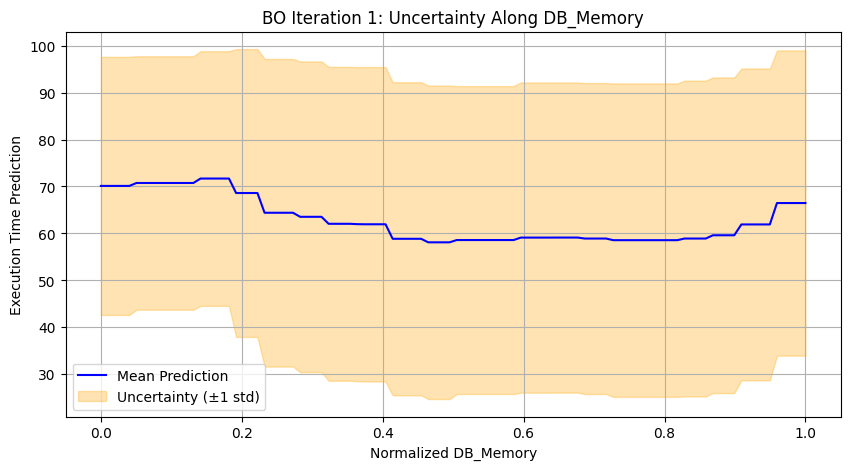

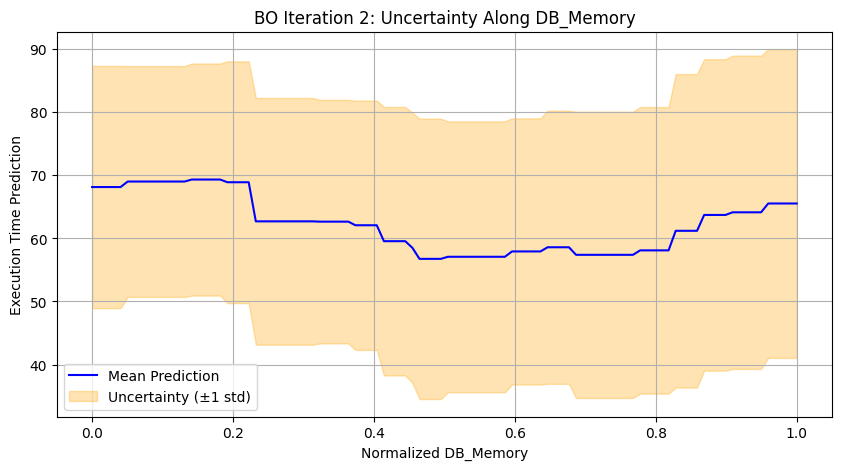

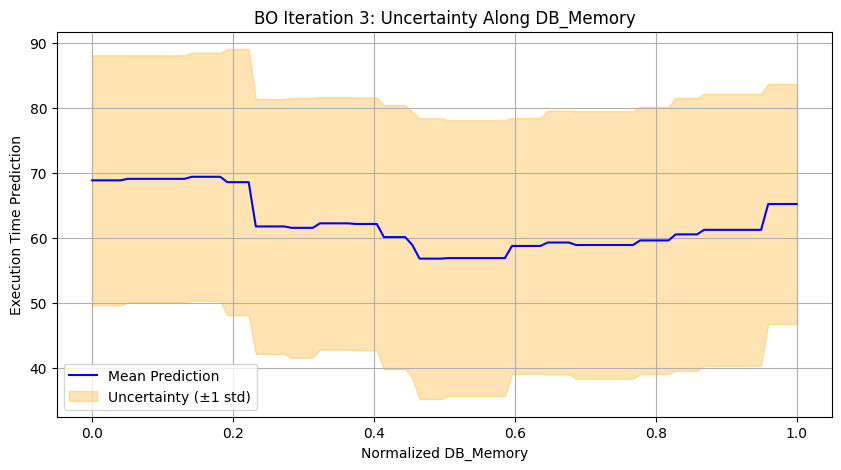

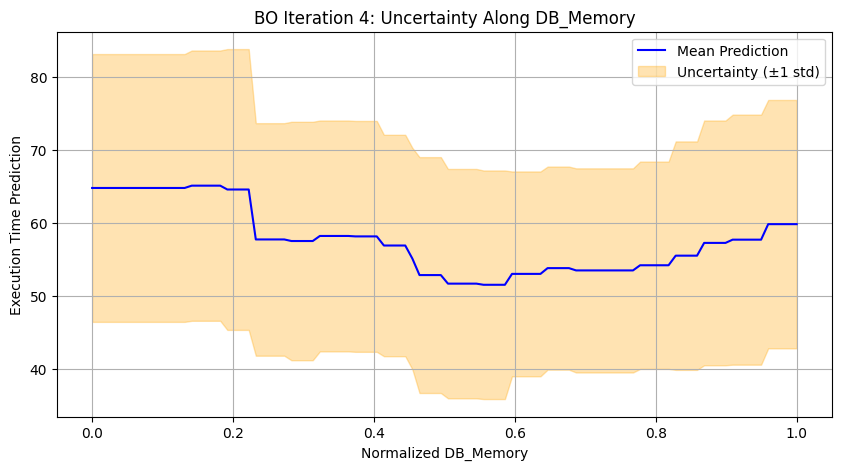

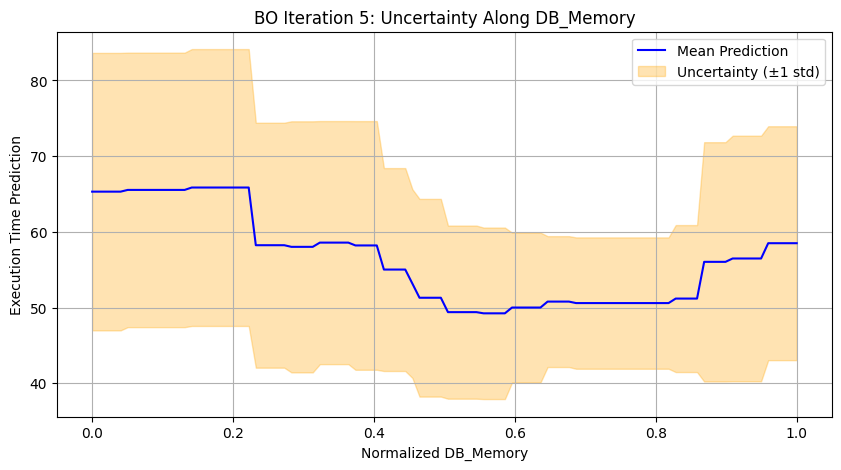

...

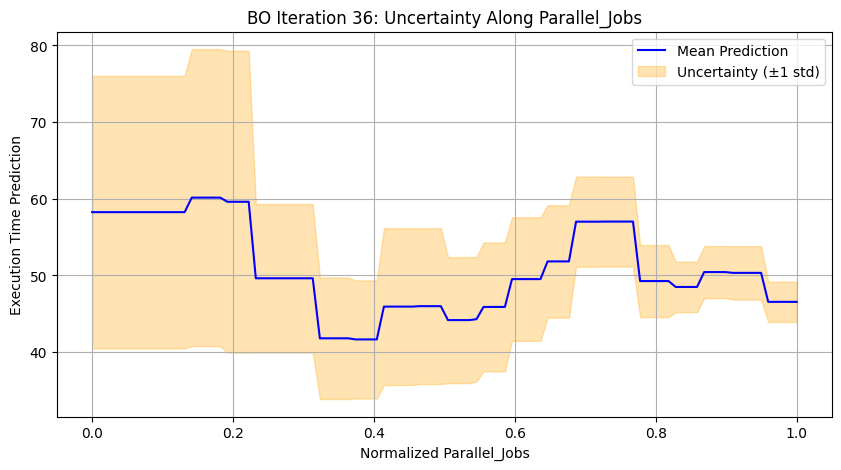

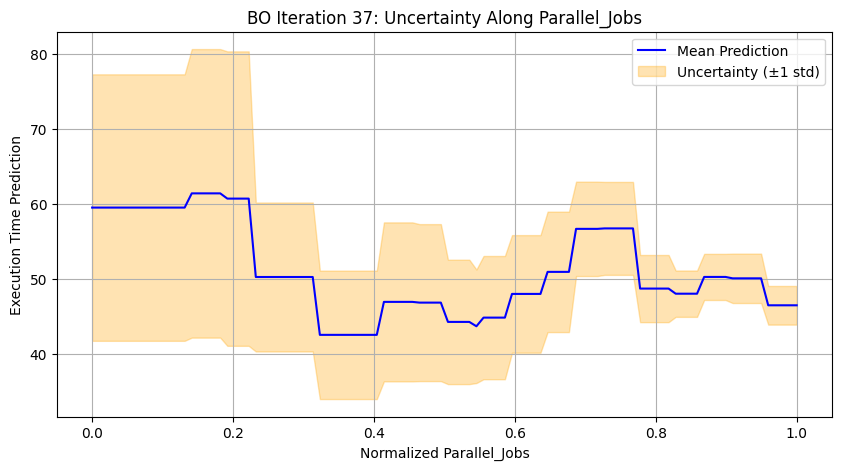

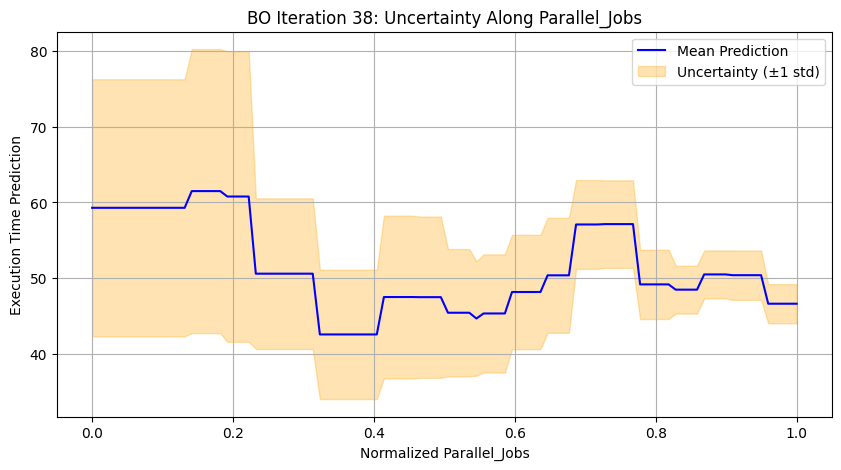

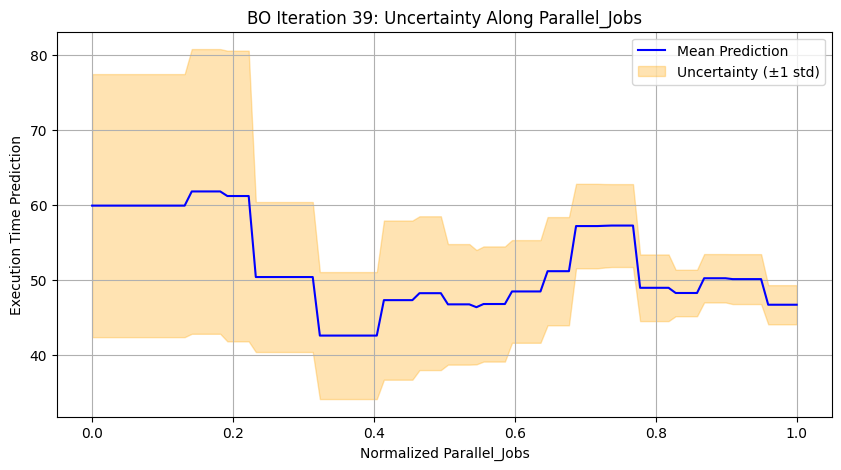

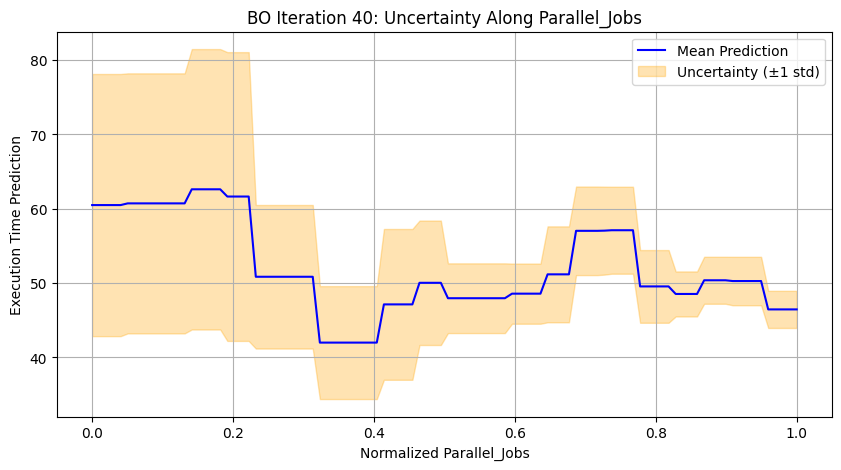

In [10]:
def plot_uncertainty_along_feature(rf_model, scaler, base_config, feature_idx, feature_name, iter_num, save=False):
    """
    Plot uncertainty by varying one feature and fixing the others at base_config.
    """
    # Create a sweep along one dimension (e.g., DB_Memory)
    sweep_range = np.linspace(0, 1, 100)  # normalized space
    X_sweep = np.tile(base_config, (100, 1))
    X_sweep[:, feature_idx] = sweep_range

    # Predict and compute uncertainty
    mean_pred, std_pred = estimate_uncertainty(rf_model, X_sweep)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(sweep_range, mean_pred, color='blue', label="Mean Prediction")
    plt.fill_between(sweep_range,
                     mean_pred - std_pred,
                     mean_pred + std_pred,
                     alpha=0.3, color='orange', label='Uncertainty (±1 std)')
    plt.title(f"BO Iteration {iter_num}: Uncertainty Along {feature_name}")
    plt.xlabel(f"Normalized {feature_name}")
    plt.ylabel("Execution Time Prediction")
    plt.legend()
    plt.grid(True)
    if save:
        plt.savefig(f"C:/Users/benja/Documents/MSC BAM/THESIS/Docs/uncertainty_plot_iter_{iter_num}_{feature_name}.png") #Change by user
    plt.show()

# Rebuild models and plot from each snapshot
for i, (_, _, iter_num) in enumerate(uncertainty_snapshots):
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_scaled[:num_initial_tests + i], df_live_bo["Execution_Time"].values[:num_initial_tests + i])

    plot_uncertainty_along_feature(
        rf_model, scaler, base_config,
        feature_idx=0, feature_name="DB_Memory", iter_num=iter_num,
        save=(i == last_idx)
    )

# For mas workers
for i, (_, _, iter_num) in enumerate(uncertainty_snapshots):
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_scaled[:num_initial_tests + i], df_live_bo["Execution_Time"].values[:num_initial_tests + i])

    plot_uncertainty_along_feature(
        rf_model, scaler, base_config,
        feature_idx=0, feature_name="MAS_Workers", iter_num=iter_num,
        save=(i == last_idx)
    )
# For para computations
for i, (_, _, iter_num) in enumerate(uncertainty_snapshots):
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train_scaled[:num_initial_tests + i], df_live_bo["Execution_Time"].values[:num_initial_tests + i])

    plot_uncertainty_along_feature(
        rf_model, scaler, base_config,
        feature_idx=0, feature_name="Parallel_Jobs", iter_num=iter_num,
        save=(i == last_idx)
    )

### Summarise the covered feature space

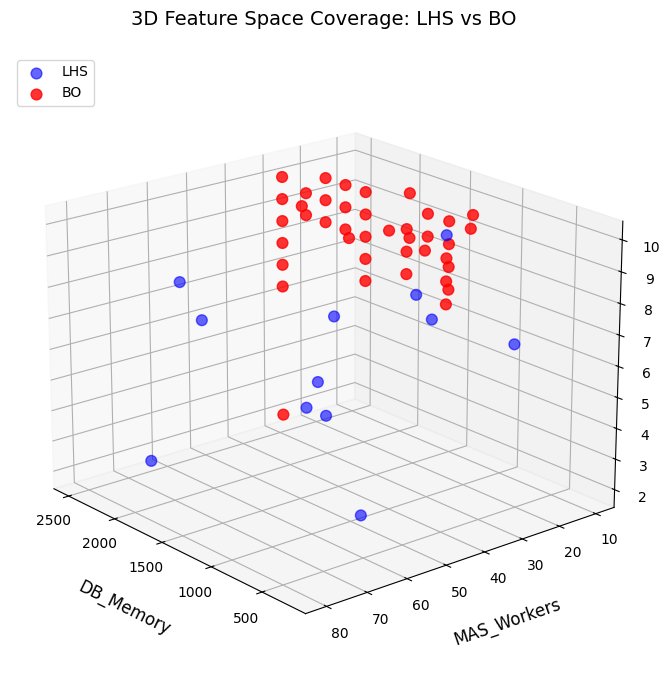

In [12]:
# Create a larger figure to avoid layout cropping
fig = plt.figure(figsize=(10, 7))  
ax = fig.add_subplot(111, projection='3d')

# Plot LHS
lhs_data = df_live_bo[df_live_bo["Selection_Method"] == "LHS"]
ax.scatter(lhs_data["DB_Memory"], lhs_data["MAS_Workers"], lhs_data["Parallel_Jobs"], 
           c='blue', label="LHS", alpha=0.6, s=60)

# Plot BO
bo_data = df_live_bo[df_live_bo["Selection_Method"] == "BO"]
ax.scatter(bo_data["DB_Memory"], bo_data["MAS_Workers"], bo_data["Parallel_Jobs"], 
           c='red', label="BO", alpha=0.8, s=60)

# Ensure axis labels are clearly visible
ax.set_xlabel("DB_Memory", fontsize=12, labelpad=15)
ax.set_ylabel("MAS_Workers", fontsize=12, labelpad=15)
ax.set_zlabel("Parallel_Jobs", fontsize=12, labelpad=15)

# Adjust axis tick labels
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)
ax.tick_params(axis='z', labelsize=10)

# Improve the 3D viewing angle (adjust as needed)
ax.view_init(elev=20, azim=140)  # This prevents axis clipping

# Add a title
ax.set_title("3D Feature Space Coverage: LHS vs BO", fontsize=14, pad=20)

# Ensure all elements fit properly
plt.tight_layout()

# Add legend
ax.legend(fontsize=10, loc="upper left")

# Show plot
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\Sample_space_lhs_vs_bo",dpi=300) # Change by user
plt.show()


### More feature space summary

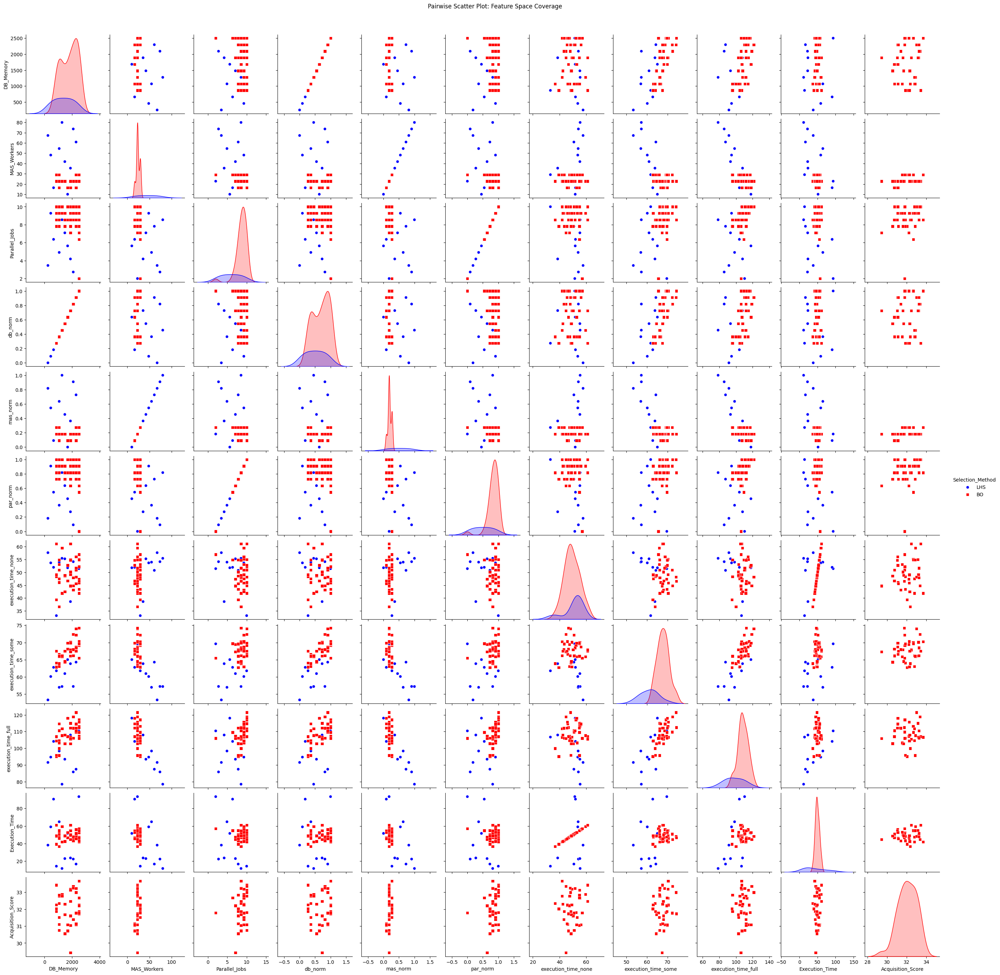

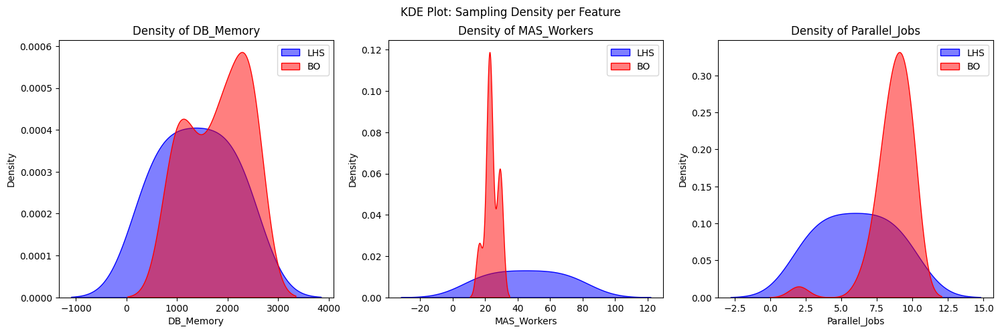

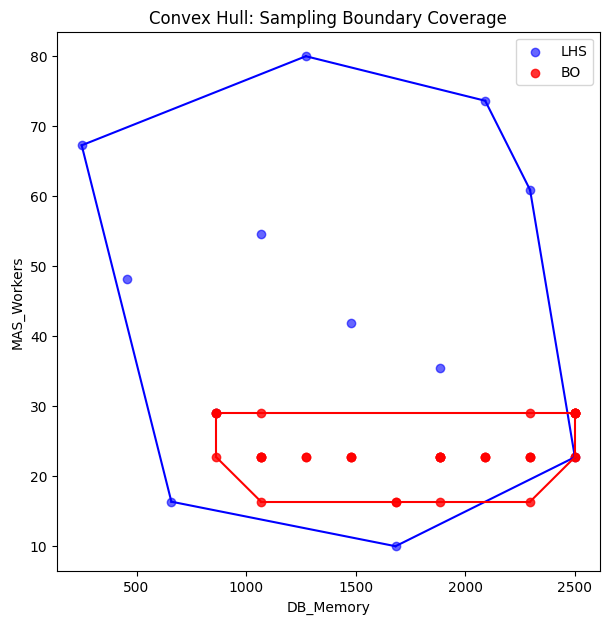

Feature Space Coverage using convex hull: 75.21%


In [14]:
# Load dataset
df = df_live_bo

# Define colors for LHS and BO
colors = {"LHS": "blue", "BO": "red"}

# Pairwise Scatter Plot Matrix** (Feature Space Projection)
sns.pairplot(df, hue="Selection_Method", palette=colors, markers=["o", "s"])
plt.suptitle("Pairwise Scatter Plot: Feature Space Coverage", y=1.02)
plt.show()

# Kernel Density Estimation (KDE) Plot (Density of Sampled Points)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

features = ["DB_Memory", "MAS_Workers", "Parallel_Jobs"]

for i, feature in enumerate(features):
    sns.kdeplot(df[df["Selection_Method"] == "LHS"][feature], label="LHS", color="blue", fill=True, alpha=0.5, ax=axes[i])
    sns.kdeplot(df[df["Selection_Method"] == "BO"][feature], label="BO", color="red", fill=True, alpha=0.5, ax=axes[i])
    axes[i].set_title(f"Density of {feature}")
    axes[i].legend()

plt.suptitle("KDE Plot: Sampling Density per Feature")
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\Coverage_sampling.png") # Change by user
plt.show()

# Convex Hull (Boundary Coverage) Visualization
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111)

# Extract 2D projection (DB_Memory vs MAS_Workers)
lhs_points = df[df["Selection_Method"] == "LHS"][["DB_Memory", "MAS_Workers"]].values
bo_points = df[df["Selection_Method"] == "BO"][["DB_Memory", "MAS_Workers"]].values

# Plot original points
ax.scatter(lhs_points[:, 0], lhs_points[:, 1], c="blue", label="LHS", alpha=0.6)
ax.scatter(bo_points[:, 0], bo_points[:, 1], c="red", label="BO", alpha=0.8)

# Compute and plot convex hull for LHS
if len(lhs_points) > 2:
    hull = ConvexHull(lhs_points)
    for simplex in hull.simplices:
        ax.plot(lhs_points[simplex, 0], lhs_points[simplex, 1], "b-")

# Compute and plot convex hull for BO
if len(bo_points) > 2:
    hull = ConvexHull(bo_points)
    for simplex in hull.simplices:
        ax.plot(bo_points[simplex, 0], bo_points[simplex, 1], "r-")

ax.set_xlabel("DB_Memory")
ax.set_ylabel("MAS_Workers")
ax.set_title("Convex Hull: Sampling Boundary Coverage")
ax.legend()
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\Convex_Hull.png") # Change by user
plt.show()

#Get percentage of FS covered
# Get all unique levels per feature
levels_per_feature = {
    'DB_Memory': df['DB_Memory'].unique(),
    'MAS_Workers': df['MAS_Workers'].unique(),
    'Parallel_Jobs': df['Parallel_Jobs'].unique()
}

# Compute total number of possible combinations
total_possible_combinations = len(list(product(*levels_per_feature.values())))

# Get number of unique sampled combinations
sampled_combinations = df[['DB_Memory', 'MAS_Workers', 'Parallel_Jobs']].drop_duplicates()
unique_sampled_combinations = sampled_combinations.shape[0]

# Calculate % feature space covered
scaler = MinMaxScaler()
sampled_scaled = scaler.fit_transform(df[["DB_Memory", "MAS_Workers"]])
hull = ConvexHull(sampled_scaled)
coverage = hull.volume * 100  # scaled total space volume is 1.0

print(f"Feature Space Coverage using convex hull: {coverage:.2f}%")

### Further feature space - area coverage

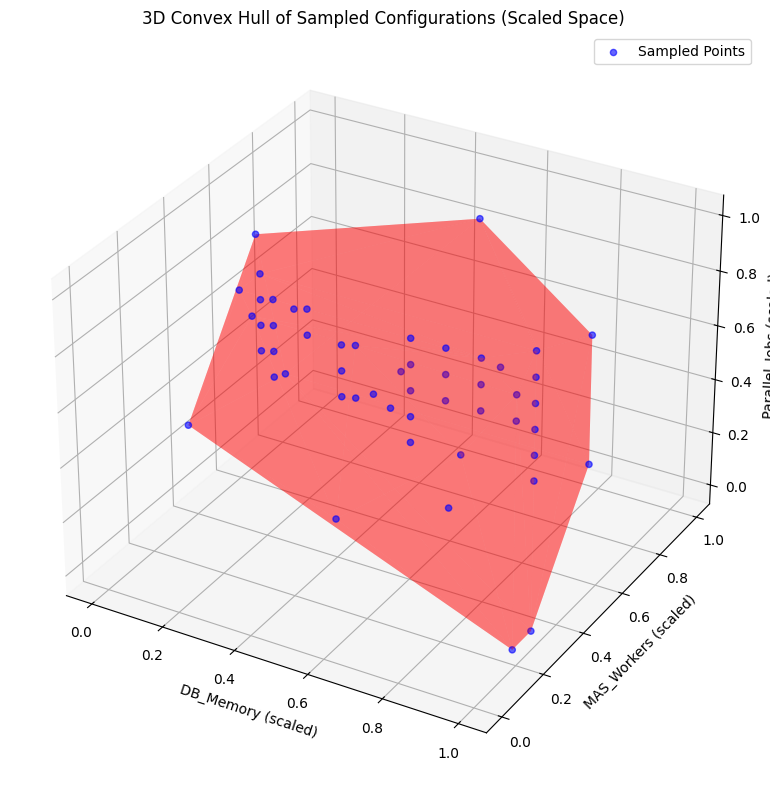

In [16]:
#Display convex hull to represent feature coverage area
# Features to analyze
features = ["DB_Memory", "MAS_Workers", "Parallel_Jobs"]

# Scale the sampled data to [0, 1] space
scaler = MinMaxScaler()
sampled_scaled = scaler.fit_transform(df[features].values)

# Compute Convex Hull
hull = ConvexHull(sampled_scaled)

# Plot in 3D
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")

# Plot sampled points
ax.scatter(sampled_scaled[:, 0], sampled_scaled[:, 1], sampled_scaled[:, 2], color="blue", alpha=0.6, label="Sampled Points")

# Plot convex hull as transparent surface
for simplex in hull.simplices:
    triangle = sampled_scaled[simplex]
    poly = Poly3DCollection([triangle], alpha=0.3, facecolor='red')
    ax.add_collection3d(poly)

# Plot cube edges for [0, 1]^3 reference box
r = [0, 1]
for s, e in zip(np.array([[x, y, z] for x in r for y in r for z in r]),
                np.array([[x, y, z] for x in r for y in r for z in r])):
    if np.sum(np.abs(s - e)) == r[1] - r[0]:
        ax.plot3D(*zip(s, e), color="black", linestyle="dashed")

# Axes labels
ax.set_xlabel("DB_Memory (scaled)")
ax.set_ylabel("MAS_Workers (scaled)")
ax.set_zlabel("Parallel_Jobs (scaled)")
ax.set_title("3D Convex Hull of Sampled Configurations (Scaled Space)")
ax.legend()
plt.tight_layout()
plt.savefig("C:/Users/benja/Documents/MSC BAM/THESIS/Docs/3D_ConvexHull_Coverage.png") # Change by user
plt.show()


### Phase 2 - Data analysis and modeling

#### GENERATE 1,000 ROWS PER SELECTED CONFIG

In [20]:
def normalize(val, min_val, max_val):
    return (val - min_val) / (max_val - min_val)

def generate_observations(df_configs, mode="full", n_obs_per_config=1000, noise_std=2.0):
    all_rows = []

    for _, row in df_configs.iterrows():
        # Normalize treatment variables
        db_norm = normalize(row["DB_Memory"], 250, 2500)
        mas_norm = normalize(row["MAS_Workers"], 10, 80)
        par_norm = normalize(row["Parallel_Jobs"], 2, 10)

        # Generate synthetic execution time
        if mode == "none":
            exec_times = np.random.normal(loc=50, scale=noise_std, size=n_obs_per_config)

        elif mode == "some":
            exec_times = (
                60
                - 10 * mas_norm
                + 5 * par_norm
                + 8 * db_norm
                + np.random.normal(loc=0, scale=noise_std, size=n_obs_per_config)
            )

        elif mode == "full":
            exec_times = (
                100
                - 25 * mas_norm
                + 15 * db_norm
                + 10 * par_norm
                - 20 * mas_norm * db_norm
                + 10 * np.sin(2 * np.pi * par_norm)
                + 5 * db_norm ** 2
                + 7 * mas_norm * par_norm
                + np.random.normal(loc=0, scale=noise_std, size=n_obs_per_config)
            )

        else:
            raise ValueError("Mode must be one of: 'none', 'some', 'full'")

        # Repeat the entire row (excluding execution time) and add synthetic times
        repeated_data = pd.DataFrame([row.to_dict()] * n_obs_per_config)
        repeated_data["Execution_Time"] = exec_times

        all_rows.append(repeated_data)

    # Combine all results into one DataFrame
    full_df = pd.concat(all_rows, ignore_index=True)
    return full_df

# Add control config back into final DataFrame
df_control = configs[configs["Configuration"] == control_config_id].copy()

# Add control to df_live_bo
df_live_bo_with_control = pd.concat([df_live_bo, df_control], ignore_index=True)

# mode can be "none", "some", or "full"
# df = generate_observations(df_live_bo_with_control, mode="full")
# df = generate_observations(df_live_bo_with_control, mode="some")
df = generate_observations(df_live_bo_with_control, mode="none")

#Make copy for TLFFNN
df_tlffnn = df.copy()

# Preview
print(df.head())
print(f"Generated rows: {len(df):,}")


     DB_Memory  MAS_Workers  Parallel_Jobs model_type request_size   db_norm  \
0  1068.181818    54.545455       4.909091        CPF         16KB  0.363636   
1  1068.181818    54.545455       4.909091        CPF         16KB  0.363636   
2  1068.181818    54.545455       4.909091        CPF         16KB  0.363636   
3  1068.181818    54.545455       4.909091        CPF         16KB  0.363636   
4  1068.181818    54.545455       4.909091        CPF         16KB  0.363636   

   mas_norm  par_norm  execution_time_none  execution_time_some  \
0  0.636364  0.363636             53.98368            56.963873   
1  0.636364  0.363636             53.98368            56.963873   
2  0.636364  0.363636             53.98368            56.963873   
3  0.636364  0.363636             53.98368            56.963873   
4  0.636364  0.363636             53.98368            56.963873   

   execution_time_full Configuration Selection_Method  Execution_Time  \
0            98.375605    Config_665       

#### SUMMARISE DATA

In [21]:
#Summarise with skimpy
skim(df)

#Create report
profile = ProfileReport(df, title="Synthetic_data Profiling Report", explorative=True)

# Save the report as an HTML file
profile.to_file("Data_profile_report.html")

#Use sweetviz for more summary reports
report = sv.analyze(df)
report.show_html("Data_sweetviz_report.html")


╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 53000  │ │ float64     │ 11    │                                                          │
│ │ Number of columns │ 15     │ │ string      │ 4     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┓  │
│ ┃ column       ┃ NA    ┃ NA %          ┃ mean   ┃ sd     ┃ p0    ┃ p25    ┃ p50    ┃ p75    ┃ p100  ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━┩  │
│ │ DB_Memory    │     0 │             0 │   1678 │  647.4 │   250 │   1068 │   1886 │   2295 │  2500 │ ▁▃▅▃▅▇ │  │
│ │ MAS_Workers  │     0 │             0 │  28.73 │  14.12 │    10 │  22.73 │  22.73 │  29.09 │    80 │   ▁▇   │  │
│ │ Parallel_Job │     0 │             0 │  7.983 │  2.108 │     2 │  7.818 │  8.545 │  9.273 │    10 │ ▁▁▁▂▇▇ │  │
│ │ s            │       │               │        │        │       │        │        │        │       │        │  │
│ │ db_norm      │     0 │             0 │ 0.6346 │ 0.2877 │     0 │ 0.3636 │ 0.7273 │ 0.9091 │     1 │ ▁▃▅▃▆▇ │  │
│ │ mas_norm     │     0 │             0 │ 0.2676 │ 0.2017 │     0 │ 0.1818 │ 0.1818 │ 0.2727 │     1 │   ▁▇   │  │
│ │ par_norm     │     0 │             0 │ 0.7479 │ 0.2635 │     0 │ 0.7273 │ 0.8182 │ 0.9091 │     1 │ ▁▁▁▂▇▇ │  │
│ │ execution_ti │     0 │             0 │  49.68 │  5.952 │ 33.17 │  46.11 │  50.18 │  54.17 │ 61.12 │ ▁▂▅▇▇▂ │  │
│ │ me_none      │       │               │        │        │       │        │        │        │       │        │  │
│ │ execution_ti │     0 │             0 │  66.06 │  4.372 │ 53.31 │  63.91 │  66.19 │  69.45 │ 74.19 │  ▂▂▆▇▂ │  │
│ │ me_some      │       │               │        │        │       │        │        │        │       │        │  │
│ │ execution_ti │     0 │             0 │    106 │  8.634 │ 78.53 │  102.9 │  106.7 │  112.1 │ 121.5 │  ▁▃▇▇▃ │  │
│ │ me_full      │       │               │        │        │       │        │        │        │       │        │  │
│ │ Execution_Ti │     0 │             0 │     50 │  2.003 │ 41.01 │  48.64 │  50.01 │  51.36 │ 59.68 │  ▁▇▇▁  │  │
│ │ me           │       │               │        │        │       │        │        │        │       │        │  │
│ │ Acquisition_ │ 13000 │ 24.5283018867 │  32.07 │ 0.9288 │ 29.43 │  31.49 │  32.12 │   32.8 │ 33.67 │ ▁▂▅▇▇▆ │  │
│ │ Score        │       │         92452 │        │        │       │        │        │        │       │        │  │
│ └──────────────┴───────┴───────────────┴────────┴────────┴───────┴────────┴────────┴────────┴───────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━┳━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┓  │
│ ┃          ┃      ┃          ┃          ┃          ┃           ┃          ┃ chars per ┃ words    ┃ total     ┃  │
│ ┃ column   ┃ NA   ┃ NA %     ┃ shortest ┃ longest  ┃ min       ┃ max      ┃ row       ┃ per row  ┃ words     ┃  │
│ ┡━━━━━━━━━━╇━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

                                             |          | [  0%]   00:00 -> (? left)

Report Data_sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [22]:
# Generate a descriptive statistics summary
summary = df.describe().transpose()

# Round for better readability
summary = summary.round(2)

# Rename columns for clarity
summary.index.name = 'Feature'
summary.columns = ['Count', 'Mean', 'Std Dev', 'Min', '25%', 'Median', '75%', 'Max']

# Export to LaTeX
summary.to_latex(
    r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\data_summary.tex",
    caption="Descriptive Statistics of Sampled Features",
    label="tab:data_summary"
)
summary

,Count,Mean,Std Dev,Min,25%,Median,75%,Max
Feature,,,,,,,,
DB_Memory,53000.0,1677.96,647.43,250.00,1068.18,1886.36,2295.45,2500.00
MAS_Workers,53000.0,28.73,14.12,10.00,22.73,22.73,29.09,80.00
Parallel_Jobs,53000.0,7.98,2.11,2.00,7.82,8.55,9.27,10.00
db_norm,53000.0,0.63,0.29,0.00,0.36,0.73,0.91,1.00
mas_norm,53000.0,0.27,0.20,0.00,0.18,0.18,0.27,1.00
par_norm,53000.0,0.75,0.26,0.00,0.73,0.82,0.91,1.00
execution_time_none,53000.0,49.68,5.95,33.17,46.11,50.18,54.17,61.12
execution_time_some,53000.0,66.06,4.37,53.31,63.91,66.19,69.45,74.19
execution_time_full,53000.0,106.04,8.63,78.53,102.88,106.71,112.07,121.48


#### Cleaning leading and na's

In [24]:
# Remove leading and trailing whitespaces from values
df.columns = df.columns.str.strip()

#Count NAs in columns
for col in df.columns:
    na_count = df[col].isna().sum()
    print(f"Missing values in {col}: {na_count}")

#No missings, if there are any in the future, they need to be tackled


Missing values in DB_Memory: 0
Missing values in MAS_Workers: 0
Missing values in Parallel_Jobs: 0
Missing values in model_type: 0
Missing values in request_size: 0
Missing values in db_norm: 0
Missing values in mas_norm: 0
Missing values in par_norm: 0
Missing values in execution_time_none: 0
Missing values in execution_time_some: 0
Missing values in execution_time_full: 0
Missing values in Configuration: 0
Missing values in Selection_Method: 1000
Missing values in Execution_Time: 0
Missing values in Acquisition_Score: 13000


#### Outliers

In [26]:
#Outlier analysis using Z scores
Numeric_cols = ["DB_Memory","MAS_Workers","Parallel_Jobs","Execution_Time"]

for col in Numeric_cols:
    z_scores = np.abs(stats.zscore(df[col]))
    outliers = df[z_scores > 3]
    print(outliers)

Empty DataFrame
Columns: [DB_Memory, MAS_Workers, Parallel_Jobs, model_type, request_size, db_norm, mas_norm, par_norm, execution_time_none, execution_time_some, execution_time_full, Configuration, Selection_Method, Execution_Time, Acquisition_Score]
Index: []
        DB_Memory  MAS_Workers  Parallel_Jobs model_type request_size  \
8000  1272.727273    80.000000       8.545455        CPF         16KB   
8001  1272.727273    80.000000       8.545455        CPF         16KB   
8002  1272.727273    80.000000       8.545455        CPF         16KB   
8003  1272.727273    80.000000       8.545455        CPF         16KB   
8004  1272.727273    80.000000       8.545455        CPF         16KB   
...           ...          ...            ...        ...          ...   
9995  2090.909091    73.636364       2.727273        CPF         16KB   
9996  2090.909091    73.636364       2.727273        CPF         16KB   
9997  2090.909091    73.636364       2.727273        CPF         16KB   
9998  209

#### DoWhy analysis

1 variables are assumed unobserved because they are not in the dataset. Configure the logging level to `logging.WARNING` or higher for additional details.


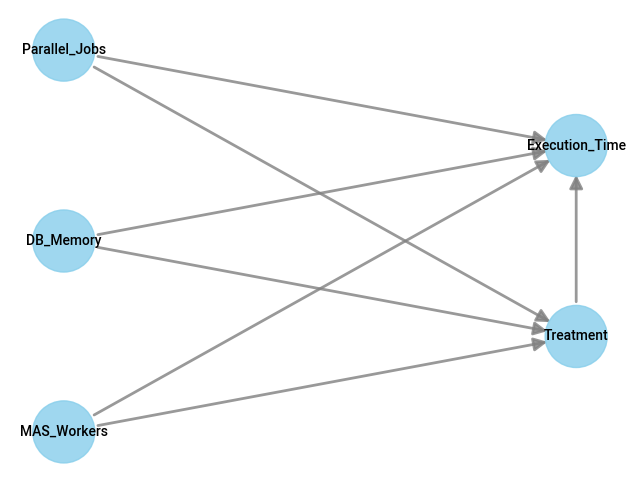

In [28]:
common_causes = ["DB_Memory", "MAS_Workers","Parallel_Jobs"] 

model = CausalModel(
    data=df,
    treatment="Treatment",  # Check for case-sensitive match
    outcome="Execution_Time",
    common_causes=common_causes
)
model.view_model()


#### Show DAG based on set up

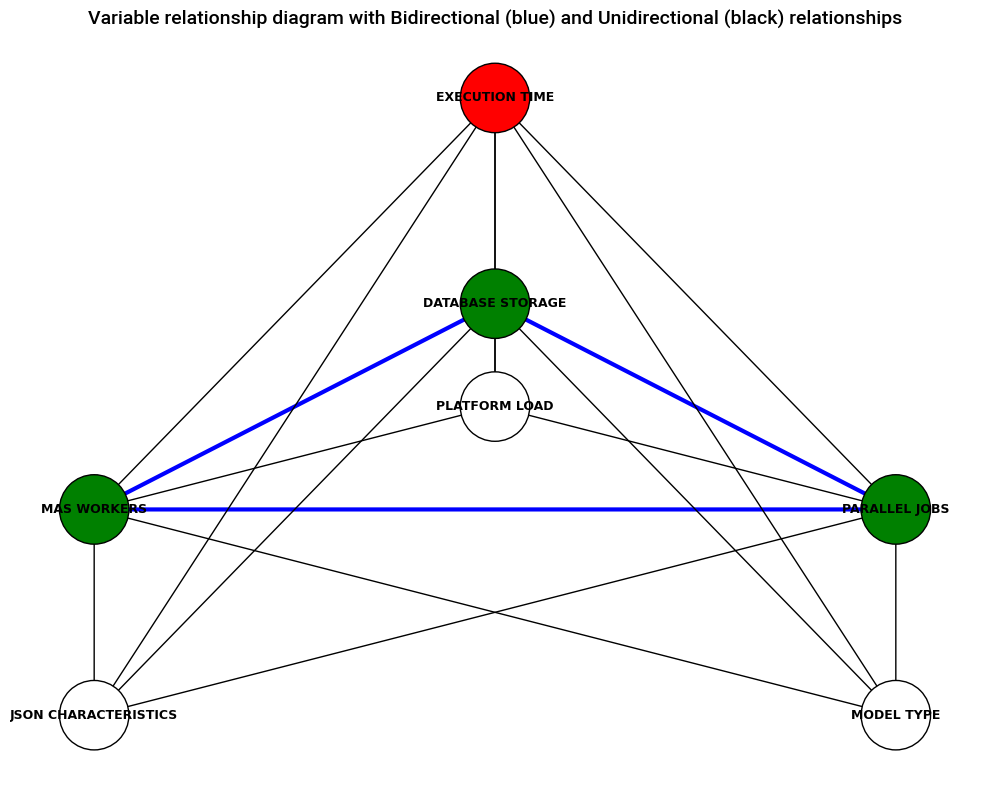

In [30]:
# Re-define edges
edges_bidirectional = [
    ('PARALLEL JOBS', 'DATABASE STORAGE'),
    ('MAS WORKERS', 'DATABASE STORAGE'),
    ('MAS WORKERS', 'PARALLEL JOBS')
]

edges_unidirectional = [
    ('PARALLEL JOBS', 'EXECUTION TIME'),
    ('DATABASE STORAGE', 'EXECUTION TIME'),
    ('MAS WORKERS', 'EXECUTION TIME'),
    ('JSON CHARACTERISTICS', 'EXECUTION TIME'),
    ('JSON CHARACTERISTICS', 'MAS WORKERS'),
    ('JSON CHARACTERISTICS', 'PARALLEL JOBS'),
    ('JSON CHARACTERISTICS', 'DATABASE STORAGE'),
    ('MODEL TYPE', 'EXECUTION TIME'),
    ('MODEL TYPE', 'MAS WORKERS'),
    ('MODEL TYPE', 'PARALLEL JOBS'),
    ('MODEL TYPE', 'DATABASE STORAGE'),
    ('PLATFORM LOAD', 'EXECUTION TIME'),
    ('PLATFORM LOAD', 'MAS WORKERS'),
    ('PLATFORM LOAD', 'PARALLEL JOBS'),
    ('PLATFORM LOAD', 'DATABASE STORAGE')
]

# Create the graph
G = nx.DiGraph()
G.add_edges_from(edges_unidirectional + edges_bidirectional)

# Manual positioning to resemble the reference image and clearly show both white nodes
pos = {
    'JSON CHARACTERISTICS': (0, 0),
    'MODEL TYPE': (2, 0),
    'MAS WORKERS': (0, 1),
    'PARALLEL JOBS': (2, 1),
    'DATABASE STORAGE': (1, 2),
    'EXECUTION TIME': (1, 3),
    'PLATFORM LOAD': (1, 1.5)
}

# Set node colors
node_colors = {
    "EXECUTION TIME": "red",
    "JSON CHARACTERISTICS": "white",
    "MODEL TYPE": "white",
    "PLATFORM LOAD": "white"
}
default_color = "green"
node_color_list = [node_colors.get(node, default_color) for node in G.nodes()]

# Draw the plot
fig, ax = plt.subplots(figsize=(10, 8))
nx.draw_networkx_nodes(G, pos, node_color=node_color_list, edgecolors="black", node_size=2500, ax=ax)
nx.draw_networkx_labels(G, pos, font_size=9, font_weight="bold", ax=ax)

# Draw edges
for a, b in edges_bidirectional:
    nx.draw_networkx_edges(
        G, pos, edgelist=[(a, b)],
        edge_color="blue", width=3, ax=ax, arrows=True, arrowstyle='<->'
    )

nx.draw_networkx_edges(
    G, pos,
    edgelist=edges_unidirectional,
    edge_color="black", width=1, ax=ax, arrows=True
)

# Final layout tweaks
plt.title("Variable relationship diagram with Bidirectional (blue) and Unidirectional (black) relationships", fontsize=14)
plt.axis("off")
plt.tight_layout()

# Save before showing
plt.savefig(r'C:\Users\benja\Documents\MSC BAM\THESIS\Docs\DAG.png', dpi=300) # Change by user
plt.show()

### Data pre-processing

In [32]:
# Define the target and treatment columns
target_col = 'Execution_Time'
treatment_features = ['DB_Memory', 'MAS_Workers', 'Parallel_Jobs']
conditioning_features = ['Model', 'Request_Size']

# Encode treatment as a single unique configuration ID - WARNING! Current treating the combination as a treatment, not each individual variable! What do we want to test???
df['Treatment'] = LabelEncoder().fit_transform(df['Configuration'])
T = df['Treatment'].values

# Since Model and Request_Size have only one level, skip conditioning
X = np.ones((df.shape[0], 1))  # single dummy input for HydraNet

#Set the target variable
y = df[target_col].values


#### DATA SPLITTING

In [33]:
# Train/test split -  No validation set as we use cross validation instead 
X_train, X_test, T_train, T_test, y_train, y_test = train_test_split(
    X, T, y, test_size=0.2, random_state=42
)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
T_train_tensor = torch.tensor(T_train, dtype=torch.long)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)

X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
T_test_tensor = torch.tensor(T_test, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)


#### Define hydranet NN 

In [35]:
# Define HydraNet
class HydraNet(nn.Module):
    def __init__(self, input_dim, num_treatments, hidden_dim=64):
        super(HydraNet, self).__init__()
        self.shared_net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU()
        )
        self.heads = nn.ModuleList([nn.Linear(hidden_dim, 1) for _ in range(num_treatments)])

    def forward(self, x, t):
        shared = self.shared_net(x)
        outputs = torch.zeros(x.size(0), 1).to(x.device)
        for i, head in enumerate(self.heads):
            idx = (t == i).nonzero(as_tuple=True)[0]
            if len(idx) > 0:
                outputs[idx] = head(shared[idx])
        return outputs

    def predict_outcomes(self, x):
        shared = self.shared_net(x)
        return torch.cat([head(shared) for head in self.heads], dim=1)

    def estimate_cate(self, x, t1, t2):
        self.eval()
        with torch.no_grad():
            y_t1 = self.forward(x, torch.full((x.size(0),), t1, dtype=torch.long).to(x.device))
            y_t2 = self.forward(x, torch.full((x.size(0),), t2, dtype=torch.long).to(x.device))
            return (y_t1 - y_t2).squeeze()

    def compute_pehe(self, x, true_cates, t1, t2):
        estimated_cates = self.estimate_cate(x, t1, t2)
        return torch.sqrt(torch.mean((estimated_cates - true_cates) ** 2)).item()


In [36]:
# Cross-Validation & Tuning Loop
#Config the tuning here
kfold = KFold(n_splits=5, shuffle=True, random_state=42) #k=5 chosen due to the instability causes by validating on just one observation with a neurnal net
hidden_dims = [32, 64, 128]
learning_rates = [0.001, 0.01]
epochs = 100

results = []

for h in hidden_dims:
    for lr in learning_rates:
        fold_losses = []
        for train_idx, val_idx in kfold.split(X):
            model = HydraNet(input_dim=X.shape[1], num_treatments=len(np.unique(T)), hidden_dim=h)
            optimizer = torch.optim.Adam(model.parameters(), lr=lr)
            loss_fn = nn.MSELoss()

            X_train = torch.tensor(X[train_idx], dtype=torch.float32)
            X_val = torch.tensor(X[val_idx], dtype=torch.float32)
            T_train = torch.tensor(T[train_idx], dtype=torch.long)
            T_val = torch.tensor(T[val_idx], dtype=torch.long)
            y_train = torch.tensor(y[train_idx], dtype=torch.float32).view(-1, 1)
            y_val = torch.tensor(y[val_idx], dtype=torch.float32).view(-1, 1)

            for epoch in range(epochs):
                model.train()
                optimizer.zero_grad()
                pred = model(X_train, T_train)
                loss = loss_fn(pred, y_train)
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_pred = model(X_val, T_val)
                val_loss = loss_fn(val_pred, y_val).item()
                fold_losses.append(val_loss)

        avg_loss = np.mean(fold_losses)
        results.append((h, lr, avg_loss))
        print(f"hidden_dim={h}, lr={lr}, avg_val_loss={avg_loss:.4f}")

# Select best model params
best_params = sorted(results, key=lambda x: x[2])[0]
print("\nBest Params:", best_params)

hidden_dim=32, lr=0.001, avg_val_loss=2046.3862
hidden_dim=32, lr=0.01, avg_val_loss=4.4580
hidden_dim=64, lr=0.001, avg_val_loss=1277.7163
hidden_dim=64, lr=0.01, avg_val_loss=4.1194
hidden_dim=128, lr=0.001, avg_val_loss=62.9409
hidden_dim=128, lr=0.01, avg_val_loss=4.0926

Best Params: (128, 0.01, 4.092592430114746)


In [37]:
# Retrain final model on full data using best parameters
best_h, best_lr, _ = best_params
final_model = HydraNet(input_dim=X.shape[1], num_treatments=len(np.unique(T)), hidden_dim=best_h)
optimizer = torch.optim.Adam(final_model.parameters(), lr=best_lr)
loss_fn = nn.MSELoss()

X_tensor = torch.tensor(X, dtype=torch.float32)
T_tensor = torch.tensor(T, dtype=torch.long)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

for epoch in range(epochs):
    final_model.train()
    optimizer.zero_grad()
    pred = final_model(X_tensor, T_tensor)
    loss = loss_fn(pred, y_tensor)
    loss.backward()
    optimizer.step()

print("\nFinal model trained on full data with best parameters.")


Final model trained on full data with best parameters.


In [38]:
#Evaluate the model using Factual Loss
final_model.eval()
with torch.no_grad():
    y_pred = final_model(X_test_tensor, T_test_tensor)
    factual_mse = nn.MSELoss()(y_pred, y_test_tensor).item()
    print(f"Factual MSE on Test Set: {factual_mse:.4f}")


Factual MSE on Test Set: 3.8530


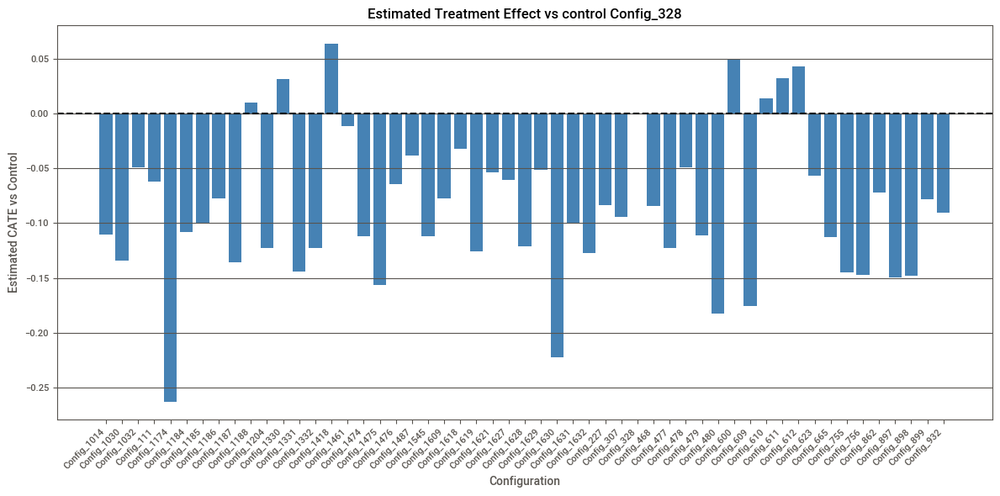

In [39]:
# Encode Treatment (each unique configuration is a treatment)
le = LabelEncoder()
df["Treatment_ID"] = le.fit_transform(df["Configuration"])
T = df["Treatment_ID"].values
treatment_ids = sorted(np.unique(T))
config_labels = le.inverse_transform(treatment_ids)

# Use the same scaler you used during training (important!)
X_tensor = torch.ones((df.shape[0], 1), dtype=torch.float32)

# Choose your control configuration (must be present in df)
control_name = control_config_id
control_id = le.transform([control_name])[0]

# Estimate CATEs vs control for all configurations
final_model.eval()
cate_estimates = []

with torch.no_grad():
    for tid in treatment_ids:
        if tid == control_id:
            cate_estimates.append(0.0)
        else:
            cate = final_model.estimate_cate(X_tensor, t1=tid, t2=control_id)
            cate_estimates.append(cate.mean().item())

plt.figure(figsize=(12, 6))
plt.bar(config_labels, cate_estimates, color="steelblue")
plt.axhline(0, linestyle="--", color="black")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Estimated CATE vs Control")
plt.xlabel("Configuration")
plt.title(f"Estimated Treatment Effect vs control {control_name}")
plt.grid(True, axis='y')
plt.tight_layout()
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\CATES_across_configs.png")
plt.show()


In [40]:
#Hydranet
final_model.eval()
with torch.no_grad():
    y_pred = final_model(X_test_tensor, T_test_tensor)
    factual_mse = nn.MSELoss()(y_pred, y_test_tensor).item()
    print(f"Factual MSE on Test Set for hydranet: {factual_mse:.4f}")

Factual MSE on Test Set for hydranet: 3.8530


#### Define two layer feed-forward NN 

In [18]:
# Define features and target
features = ['DB_Memory', 'MAS_Workers', 'Parallel_Jobs']
X = df_tlffnn[features].values

# Convert 'Configuration' from strings to integer treatment IDs
le = LabelEncoder()
df_tlffnn['Treatment_ID'] = le.fit_transform(df_tlffnn['Configuration'])
T = df_tlffnn['Treatment_ID'].values.astype(np.int64)
y = df_tlffnn['Execution_Time'].values

# Split into train and test sets
X_train, X_test, T_train, T_test, y_train, y_test = train_test_split(
    X, T, y, test_size=0.2, random_state=42
)

# Scale features using training data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

T_train_tensor = torch.tensor(T_train, dtype=torch.long)
T_test_tensor = torch.tensor(T_test, dtype=torch.long)

y_train_tensor = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)

NameError: name 'df_tlffnn' is not defined

In [47]:
class CATEPredictor(nn.Module):
    def __init__(self, input_dim, num_treatments, hidden_dims):
        super(CATEPredictor, self).__init__()
        self.embedding = nn.Embedding(num_treatments, 4)  # 4-dim embedding
        self.model = nn.Sequential(
            nn.Linear(input_dim + 4, hidden_dims[0]),
            nn.ReLU(),
            nn.Linear(hidden_dims[0], hidden_dims[1]),
            nn.ReLU(),
            nn.Linear(hidden_dims[1], 1)
        )

    def forward(self, x, t):
        t_embed = self.embedding(t)           # (batch_size, 4)
        x_t = torch.cat([x, t_embed], dim=1)  # (batch_size, input_dim + 4)
        return self.model(x_t)


In [48]:
# Hyperparameter tuning
hidden_dim_options = [(64, 32), (128, 64), (32, 16)]
learning_rates = [0.001, 0.01]
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

best_config = None
lowest_loss = float("inf")

for hidden_dims in hidden_dim_options:
    for lr in learning_rates:
        fold_losses = []
        for train_idx, val_idx in kfold.split(X_train_tensor):
            model = CATEPredictor(input_dim=X_train_tensor.shape[1], num_treatments=len(np.unique(T_train)), hidden_dims=hidden_dims)
            optimizer = optim.Adam(model.parameters(), lr=lr)
            loss_fn = nn.MSELoss()

            for epoch in range(50):
                model.train()
                optimizer.zero_grad()
                pred = model(X_train_tensor[train_idx], T_train_tensor[train_idx])
                loss = loss_fn(pred, y_train_tensor[train_idx])
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_pred = model(X_train_tensor[val_idx], T_train_tensor[val_idx])
                val_loss = loss_fn(val_pred, y_train_tensor[val_idx]).item()
                fold_losses.append(val_loss)

        avg_loss = np.mean(fold_losses)
        print(f"Hidden: {hidden_dims}, LR: {lr}, Val Loss: {avg_loss:.4f}")
        if avg_loss < lowest_loss:
            lowest_loss = avg_loss
            best_config = (hidden_dims, lr)

print(f"Best Config: Hidden Layers {best_config[0]}, Learning Rate {best_config[1]} with Val Loss {lowest_loss:.4f}")

Hidden: (64, 32), LR: 0.001, Val Loss: 2237.5757
Hidden: (64, 32), LR: 0.01, Val Loss: 33.4695
Hidden: (128, 64), LR: 0.001, Val Loss: 1632.3686
Hidden: (128, 64), LR: 0.01, Val Loss: 16.7269
Hidden: (32, 16), LR: 0.001, Val Loss: 2404.2213
Hidden: (32, 16), LR: 0.01, Val Loss: 69.8656

✅ Best Config: Hidden Layers (128, 64), Learning Rate 0.01 with Val Loss 16.7269


In [49]:
# Retrain final model
final_ffnn_model = CATEPredictor(input_dim=X_train_tensor.shape[1], num_treatments=len(np.unique(T_train)), hidden_dims=best_config[0])
optimizer = optim.Adam(final_ffnn_model .parameters(), lr=best_config[1])
loss_fn = nn.MSELoss()

for epoch in range(200):
    final_ffnn_model .train()
    optimizer.zero_grad()
    pred = final_ffnn_model (X_train_tensor, T_train_tensor)
    loss = loss_fn(pred, y_train_tensor)
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0 or epoch == 199:
        print(f"Epoch {epoch}: Loss = {loss.item():.4f}")

Epoch 0: Loss = 2511.5901
Epoch 50: Loss = 15.9434
Epoch 100: Loss = 4.4958
Epoch 150: Loss = 4.0673
Epoch 199: Loss = 4.0477


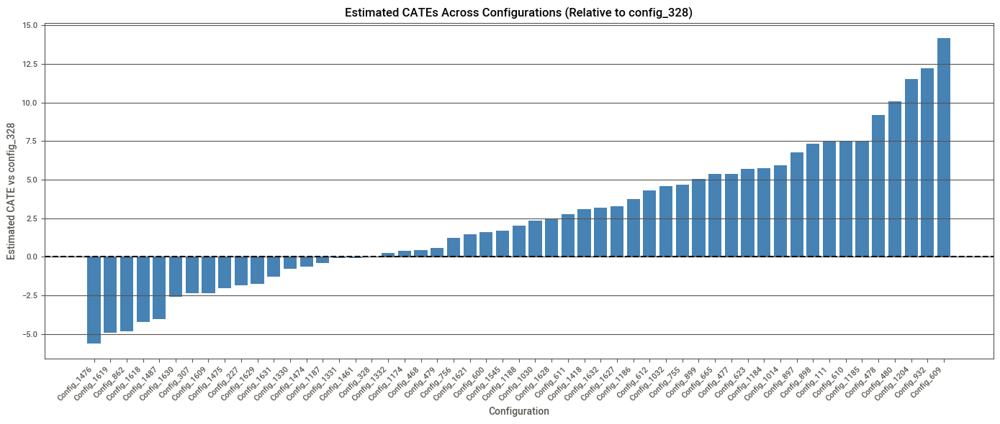

In [50]:
# Sample a subset of rows for evaluation
sample_df = df_tlffnn.sample(n=500, random_state=42)
X_eval = sample_df[features].values
X_eval_scaled = scaler.transform(X_eval)
X_eval_tensor = torch.tensor(X_eval_scaled, dtype=torch.float32)

# Set control configuration to 'config_328'
control_label = "Config_328"
control_id = df_tlffnn[df_tlffnn["Configuration"] == control_label]["Treatment_ID"].iloc[0]

# Evaluate the model and estimate CATEs
final_ffnn_model.eval()
cate_per_config = []

with torch.no_grad():
    unique_treatments = np.sort(np.unique(T))

    for t_id in unique_treatments:
        t_tensor = torch.full((X_eval_tensor.shape[0],), t_id, dtype=torch.long)
        pred_treatment = final_ffnn_model(X_eval_tensor, t_tensor)

        t_control = torch.full((X_eval_tensor.shape[0],), control_id, dtype=torch.long)
        pred_control = final_ffnn_model(X_eval_tensor, t_control)

        cate = (pred_treatment - pred_control).mean().item()
        cate_per_config.append((t_id, cate))

# Sort results
cate_per_config.sort(key=lambda x: x[1])
sorted_ids, sorted_cates = zip(*cate_per_config)

# Get human-readable configuration labels
config_labels = df_tlffnn.drop_duplicates('Treatment_ID').set_index('Treatment_ID').loc[list(sorted_ids), 'Configuration'].values

plt.figure(figsize=(14, 6))
plt.bar(config_labels, sorted_cates, color="steelblue")
plt.axhline(0, linestyle="--", color="black")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Estimated CATE vs config_328")
plt.xlabel("Configuration")
plt.title("Estimated CATEs Across Configurations (Relative to config_328)")
plt.tight_layout()
plt.grid(True, axis='y')
plt.savefig(r"C:\Users\benja\Documents\MSC BAM\THESIS\Docs\CATES_across_configs_syn_tlffnn.png") # Change by user
plt.show()


In [52]:
# Evaluate two-layer FFNN
final_ffnn_model.eval()
with torch.no_grad():
    y_pred_ffnn = final_ffnn_model(X_test_tensor, T_test_tensor)  
    ffnn_mse = nn.MSELoss()(y_pred_ffnn, y_test_tensor).item()
    print(f"FFNN Factual MSE on Test Set: {ffnn_mse:.4f}")


FFNN Factual MSE on Test Set: 3.8585
